# Source Code Analysis

## Initialization

In [1]:
import os
import sys

def add_path(path):
    if path not in sys.path:
        sys.path.insert(0, path)
        sys.path.append(path)    
add_path('/home/jjian03/anaconda3/lib/python3.7/site-packages')
add_path(os.path.abspath(os.path.join('..')))


### Load Data

In [2]:
import time
import datetime
import os
import base64
import pandas as pd
from singleton_decorator import singleton

import findspark
findspark.init('/opt/cloudera/parcels/SPARK2-2.3.0.cloudera3-1.cdh5.13.3.p0.458809/lib/spark2/')
from pyspark.sql import SparkSession
from pyspark.sql import SQLContext
from pyspark.sql import functions as fn
from pyspark.sql.types import *

from sklearn.utils import random
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split, cross_val_score, ShuffleSplit


seed=77

def shape(df):
    return (len(df), len(df.columns))


@singleton
class DataSource:
    def __init__(self, fract=.04, training_rate=.7, seed=77):
        self._spark = SparkSession.builder.\
            config('spark.app.name', 'elastic_net_reg').\
            config('spark.dynamicAllocation.enabled','true').\
            config('spark.dynamicAllocation.maxExecutors','50').\
            config('spark.dynamicAllocation.executorIdleTimeout','30s').\
            config('spark.driver.maxResultSize', '8g').\
            config('spark.driver.memory', '50g').\
            config('spark.executor.memory', '10g').\
            config('spark.task.maxFailures', '3').\
            config('spark.yarn.am.memory', '50g').\
            config('spark.yarn.max.executor.failures', '3').\
            config('spark.kryoserializer.buffer.max','1024m').\
            config('spark.yarn.executor.memoryOverhead', '50g').\
            getOrCreate()
        self._sc = self._spark.sparkContext
        self._spark_sql = SQLContext(self._sc)
        print(self._spark.version)
        self._label_name = 'label'
        self._cache_dataset_file_name = '../raw_data_01.json'
        self.re_initialize(fract, training_rate, seed)
        print('Initialized')

    def load_dataset(self, path, name):
        return self._spark.read.parquet(path).registerTempTable(name)

    @property
    def sparkContext(self):
        return self._sc

    @property
    def sparkSQL(self):
        return self._spark_sql

    def re_initialize(self, fract, training_rate, seed):

        self.load_dataset('/user/jjian03/WebResourceQuality.parquet', 'web_resource_quality')
        self.load_dataset('/user/jjian03/WebResourceQuality_pmid.parquet', 'web_resource_quality_pmid')
        self.load_dataset('/datasets/MAG_20200403/MAG_Azure_Parquet/mag_parquet/Papers.parquet', 'Paper')
        self.load_dataset('/user/lliang06/icon/MAG_publication_features.parquet', 'mag')

        if os.path.isfile(self._cache_dataset_file_name): 
            self._raw_data = pd.read_json(self._cache_dataset_file_name, orient='index')
        else:
            self._raw_data = self._spark_sql.sql('''
                SELECT wr.id
                    , wr.url
                    , wr.actual_scrape_url
                    , wr.first_appear
                    , wr.first_available_timestamp
                    , wr.last_available_timestamp
                    , wr.header
                    , wr.html_text
                    , wr.comment
                    , wr.from_waybackmachine
                    , wr.http_status_code
                    , wr.original_check_failure
                    , wr.original_check_error_log
                    , wr.terminate_reason
                    , wr.terminate_reason_error_log

                    , m.paperId
                    , m.total_num_of_paper_citing
                    , m.total_num_of_author_citing
                    , m.total_num_of_affiliation_citing
                    , m.total_num_of_journal_citing
                    , m.total_num_of_author_self_citation
                    , m.total_num_of_affiliation_self_citation
                    , m.total_num_of_journal_self_citation
                    , m.avg_year
                    , m.min_year
                    , m.max_year
                    , m.median
                    , m.num_of_author
                    , m.num_of_author_citing
                    , m.num_of_affiliation_citing
                    , m.num_of_journal_citing
                    , m.avg_hindex
                    , m.first_author_hindex
                    , m.last_author_hindex
                    , m.avg_mid_author_hindex
                    , m.paper_unique_affiliation

                FROM web_resource_quality wr
                JOIN web_resource_quality_pmid wr_doi ON wr.id = wr_doi.id
                JOIN Paper p ON wr_doi.doi = p.doi
                JOIN mag m ON p.paperId = m.paperId
                WHERE wr.label IS NOT NULL
                AND wr.label IN ("0")
                AND isNaN(wr.label) = false
                AND wr.first_appear IS NOT NULL
                AND isNaN(wr.first_appear) = false
                AND lower(wr.url) NOT LIKE "%doi.org%"
            ''') \
            .orderBy(fn.rand(seed=seed)) \
            .sample(False, fract, seed) \
            .toPandas()
            self._raw_data.to_json(self._cache_dataset_file_name, orient='index')

        print(f'Sample Size - raw_data: {len(self._raw_data)}')

        self._train_data, self._test_data = train_test_split(self._raw_data, test_size=1-training_rate, random_state=seed)

    @property
    def raw_data(self):
        return self._raw_data

    @property
    def train_data(self):
        return self._train_data

    @property
    def test_data(self):
        return self._test_data

In [3]:
start_time = time.time()
raw_data = DataSource().raw_data

raw_data.info()

print(f'raw_data: {shape(raw_data)}')

t = str(datetime.timedelta(seconds=time.time() - start_time)).split(':')
print("--- %s minutes, %.2f seconds ---" % (t[1], float(t[2])))

2.3.0.cloudera3
Sample Size - raw_data: 14673
Initialized
<class 'pandas.core.frame.DataFrame'>
Int64Index: 14673 entries, 0 to 14672
Data columns (total 36 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   id                                      14673 non-null  object 
 1   url                                     14673 non-null  object 
 2   actual_scrape_url                       14673 non-null  object 
 3   first_appear                            14673 non-null  int64  
 4   first_available_timestamp               0 non-null      float64
 5   last_available_timestamp                14673 non-null  int64  
 6   header                                  14673 non-null  object 
 7   html_text                               14673 non-null  object 
 8   comment                                 14673 non-null  object 
 9   from_waybackmachine                     14673 non-null  int64  
 10  

### Train Test Split

In [4]:
start_time = time.time()

train_data = DataSource().train_data
test_data = DataSource().test_data


print('Shape of the dataframe:')
print(f'train_data: {shape(train_data)}')
print(f'test_data: {len(test_data)}')

t = str(datetime.timedelta(seconds=time.time() - start_time)).split(':')
print("--- %s minutes, %.2f seconds ---" % (t[1], float(t[2])))

Shape of the dataframe:
train_data: (10271, 36)
test_data: 4402
--- 00 minutes, 0.00 seconds ---


## Feature Engineering

### Build Pipeline

In [5]:
def print_unique_count(df):
    df_unique = pd.DataFrame()
    for col_name in df.columns:
        df_unique[col_name] = [len(df[col_name].unique())]

    df_unique['total'] = [len(df)]
    df_unique.index = ['unique count']
    return df_unique.T.iloc[:,0]

def print_na_count(df):
    df_na = pd.DataFrame()
    for col_name in df.columns:
        df_na[col_name] = [df[col_name].isna().sum()]

    df_na['total'] = [len(df)]
    df_na.index = ['na count']
    return df_na.T.iloc[:,0]


display(pd.DataFrame({
    'unique count': print_unique_count(train_data),
    'na count': print_na_count(train_data)
}, index=train_data.columns))

,unique count,na count
id,9828,0
url,9828,0
actual_scrape_url,9799,0
first_appear,22,0
first_available_timestamp,1,10271
last_available_timestamp,9795,0
header,9828,0
html_text,7155,0
comment,2267,0
from_waybackmachine,2,0


#### Age of the URL (Label)

In [6]:
import math
import datetime
from sklearn.pipeline import Pipeline
from sklearn.base import BaseEstimator,TransformerMixin
from bson.objectid import ObjectId
pd.options.mode.chained_assignment = None


class LabelBuilder(BaseEstimator, TransformerMixin):
    def __init__(self):
        pass

    def fit(self,x,y=None):
        return self

    def transform(self,x,y=None):
        result = x
        first_appear = result.first_appear.fillna(self._extract_year(result.id.apply(ObjectId)))
        last_appear = result.last_available_timestamp \
            .apply(self._convert_timestamp_to_coef) \
            .fillna(self._extract_year(result.id.apply(ObjectId))) \
            .astype(int)
        result.loc[:,'label'] = last_appear - first_appear
        result = result[result.label.apply(lambda x: not math.isnan(x))]
        result = result[result.label >= 0]
        return result

    def _extract_year(self, ids):
        return ids.apply(lambda x: x.generation_time.year)

    def _convert_timestamp_to_coef(self, ts):
        if None is ts or np.nan is ts or math.isnan(ts):
            return ts
        ts_str = str(ts).strip()
        if '' == ts_str:
            return ts

        ts_str = str(int(float(ts_str)))
        ts_obj = datetime.datetime.strptime(ts_str, "%Y%m%d%H%M%S")
        return ts_obj.year


#### Features in URL

- Length of the url hierarchy

In [7]:
class URLLengthCounter(BaseEstimator, TransformerMixin):
    def __init__(self):
        pass

    def fit(self,x,y=None):
        return self

    def transform(self,x,y=None):
        result = x
        result.loc[:,'url_length'] = result['url'].apply(self._get_length)
        return result

    def _get_length(self, url):
        return len(url)


- url parser

In [8]:
from urllib.parse import urlparse


class URLParser(BaseEstimator, TransformerMixin):
    def __init__(self):
        self._lambdas = dict()

    def fit(self,x,y=None):
        return self

    def transform(self,x,y=None):
        result = x
        result.loc[:,'url_parse_obj'] = result['url'].apply(urlparse)

        result.loc[:,'scheme'] = result.url_parse_obj.apply(lambda x: x.scheme)
        result.loc[:,'netloc'] = result.url_parse_obj.apply(lambda x: x.netloc)
        result.loc[:,'path'] = result.url_parse_obj.apply(lambda x: x.path)
        result.loc[:,'params'] = result.url_parse_obj.apply(lambda x: x.query).apply(lambda x: None if '' == x.strip() else x)

        result = result.drop(['url_parse_obj'], axis=1)
        return result

    def register_new_column(self, col_name, lbd):
        self._lambdas[col_name] = lbd
        return self

- Depth of the url hierarchy

In [9]:
class URLDepthCounter(BaseEstimator, TransformerMixin):
    def __init__(self):
        pass

    def fit(self,x,y=None):
        return self

    def transform(self,x,y=None):
        result = x
        result.loc[:,'url_depth'] = result['path'].apply(self._get_depth)
        return result

    def _get_depth(self, path):
        last_idx = path.rindex('/')
        if last_idx + 1 < len(path):
            last_idx = len(path)
        return path[:last_idx].count('/')


- Has WWW subdomain 

In [10]:
class HasWWWConverter(BaseEstimator, TransformerMixin):
    def __init__(self):
        pass

    def fit(self,x,y=None):
        return self

    def transform(self,x,y=None):
        result = x
        result.loc[:, 'has_www'] = result['netloc'].apply(self._has_www)
        return result

    def _has_www(self, domain):
        return int(domain.startswith('www.'))


- Level of the Subdomain

In [11]:
class SubdomainLevelCounter(BaseEstimator, TransformerMixin):
    def __init__(self):
        pass

    def fit(self,x,y=None):
        return self

    def transform(self,x,y=None):
        result = x
        result.loc[:, 'subdomain_level'] = result['netloc'].apply(self._get_level)
        return result

    def _get_level(self, domain):
        return domain.count('.')


- Number of HTTP-Get parameters

In [12]:
import numpy as np


class RequestParameterCounter(BaseEstimator, TransformerMixin):
    def __init__(self):
        pass

    def fit(self,x,y=None):
        return self

    def transform(self,x,y=None):
        result = x
        result['params'] = result['params'].replace(np.nan, '', regex=True)
        result.loc[:, 'param_cnt'] = result['params'].apply(self._count_param)
        return result

    def _count_param(self, params):
        if params is '':
            return 0
        return params.count('&') + 1


- Domain Suffix

In [13]:
!/home/jjian03/anaconda3/bin/pip install feature_engine

In [14]:
from feature_engine import categorical_encoders


class DomainSuffixBuilder(BaseEstimator, TransformerMixin):
    def __init__(self):
        self._suffix_dict = None

    def fit(self,x,y=None):
        new_features = self.build_suffix_port_feature(x)
        new_features = new_features.dropna()
        encoder = categorical_encoders.CountFrequencyCategoricalEncoder(
            encoding_method='frequency',
            variables=['suffix'])
        encoder.fit(new_features)
        self._suffix_dict = encoder.encoder_dict_['suffix']
        return self

    def transform(self,x,y=None):
        result = x
        new_features = self.build_suffix_port_feature(x)
        for col_name in new_features.columns:
            result.loc[:, col_name] = new_features[col_name]
        result.loc[:, 'suffix'] = result.suffix.apply(lambda v: self._suffix_dict[v] if v in self._suffix_dict else 0)

        result = result.dropna(subset=['is_port_access', 'suffix', 'suffix_idx'])
        return result

    def build_suffix_port_feature(self,x):
        result = x
        # Remove incorrect urls
#         result = result[result['netloc'].apply(lambda val: '.' in val)]
        # Build features
        suffix = result.netloc.apply(DomainSuffixBuilder._get_url_suffix)
        is_port_access = suffix.apply(DomainSuffixBuilder._is_port_access)
        suffix_idx = suffix.apply(DomainSuffixBuilder._clean_url_suffix)
        
        return pd.DataFrame({'suffix': suffix, 'suffix_idx': suffix_idx, 'is_port_access': is_port_access, })

    @property
    def suffix_dict(self):
        return self._suffix_dict

    @staticmethod
    def _get_url_suffix(url):
        if not '.' in url:
            return None
        last_idx = url.rindex('.')
        return url[last_idx + 1:]

    @staticmethod
    def _clean_url_suffix(url):
        if None is url:
            return None
        return url.split(':')[0]

    @staticmethod
    def _is_port_access(suffix):
        if None is suffix:
            return None
        return int(len([token for token in suffix.split(':') if token.strip() != '']) > 1)


- Remove the Incorrect Domains

TLD ranges from 2 to 63

Ref: https://en.wikipedia.org/wiki/Domain_Name_System#cite_ref-rfc1034_1-2

In [15]:
import re


class IncorrectDomainUrlCleaner(BaseEstimator, TransformerMixin):
    def __init__(self):
        # TLD ranges from 2 to 63
        self._regex = re.compile(r'^[a-zA-Z]{2,63}$', re.I)

    def fit(self,x,y=None):
        return self
        
    def transform(self,x,y=None):
        result = x
        result.loc[:, 'is_correct'] = result.suffix_idx.apply(self._is_correct)
        result = result[result.is_correct]
        result = result.drop('is_correct', axis=1)
        return result

    def _is_correct(self, domain_suffix):
        return True if self._regex.match(domain_suffix) else False


- Protocol Type Conversion

In [16]:
from feature_engine import categorical_encoders


class ColumnRenamer(BaseEstimator, TransformerMixin):
    def __init__(self, mapping):
        self._mapping = mapping

    @property
    def mapping(self):
        return self._mapping

    def fit(self,x,y=None):
        return self
        
    def transform(self,x,y=None):
        result = x
        self._mapping = {key: value for key, value in self._mapping.items() if key in result.columns}
        result = result.rename(columns=self._mapping)
        return result


- Has content-type

In [17]:
class BinaryNAEncoder(BaseEstimator, TransformerMixin):
    def __init__(self, columns):
        self._columns = columns

    @property
    def columns(self):
        return self._columns

    def fit(self,x,y=None):
        return self
        
    def transform(self,x,y=None):
        result = x
        self._columns = [col_name for col_name in self._columns if col_name in result.columns]
        for col_name in self._columns:
            result.loc[:,f'has_{col_name}'] = result[col_name] \
                .apply(lambda x: x not in [np.nan, None]) \
                .map({True: 1, False: 0})

        return result


## Modeling

### Data Cleaning

#### Remove redundant features

In [18]:
class FeatureRemover(BaseEstimator, TransformerMixin):
    def __init__(self, features):
        self._removed_features = None
        self._features = features

    @property
    def removed_features(self):
        return self._removed_features

    def fit(self,x,y=None):
        return self

    def transform(self,x,y=None):
        result = x
        self._removed_features = [col_name for col_name in self._features if col_name in result.columns]
        result = result.drop(self._removed_features, axis=1)
        return result


class FeaturePicker(BaseEstimator, TransformerMixin):
    def __init__(self, features):
        self._picked_features = None
        self._features = features

    @property
    def picked_features(self):
        return self._picked_features

    def fit(self,x,y=None):
        return self

    def transform(self,x,y=None):
        result = x
        self._picked_features = [col_name for col_name in self._features if col_name in result.columns]
        result = result[self._picked_features]
        return result


#### Miscellaneous Clean Up

- Standardize variance
- Convert Categorical Feature into Frequency Based Numberical Index 
- Remove low variance features

In [19]:
from itertools import compress
from sklearn import feature_selection


class LowVarianceRemover(BaseEstimator, TransformerMixin):
    def __init__(self, threshold):
        self._p = threshold
        self._bi_vt = feature_selection.VarianceThreshold(threshold=threshold*(1-threshold))
        self._regular_vt = feature_selection.VarianceThreshold(threshold=threshold)
        self._dropped_columns = list()

    @property
    def threshold(self):
        return self._threshold

    @property
    def dropped_columns(self):
        return self._dropped_columns

    def fit(self,x,y=None):
        return self

    def transform(self,x,y=None):
        result = x

        df_unique = pd.DataFrame()
        for col_name in result.columns:
            if 'label' != col_name:
                df_unique[col_name] = [len(result[col_name].unique())]

        df_unique.index = ['unique count']
        df_unique = df_unique.T.squeeze()

        bi_columns = df_unique[df_unique == 2].index.tolist()
        regular_columns = df_unique[df_unique != 2].index.tolist()

        if len(bi_columns) >0:
            self._bi_vt.fit(result[bi_columns])
            bi_mask = self._bi_vt.variances_ < self._p * (1 - self._p)            
            self._dropped_columns = self._dropped_columns + list(compress(bi_columns, bi_mask))
        if len(regular_columns) >0 :
            self._regular_vt.fit(result[regular_columns])
            regular_mask = self._regular_vt.variances_ < self._p
            self._dropped_columns = self._dropped_columns + list(compress(regular_columns, regular_mask))

        if len(self._dropped_columns) > 0:
            remover = FeatureRemover(self._dropped_columns)
            result = remover.transform(result)
        return result


#### Add Sklearn Build-in Function

In [20]:
from sklearn import preprocessing


class CustomizedStandardizer(BaseEstimator, TransformerMixin):
    def __init__(self, norm='l2'):
        self._pipe = Pipeline([
#             ('normalizer', preprocessing.Normalizer(norm=norm, copy=True)),
            ('standard_scaler', preprocessing.StandardScaler()),

        ])
        self._columns = None

    @property
    def columns(self):
        return self._columns

    def fit(self,x,y=None):
        return self

    def transform(self,x,y=None):
        result = x

        df_unique = pd.DataFrame()
        for col_name in result.drop('label', axis=1).columns:
            df_unique[col_name] = [len(result[col_name].unique())]

        df_unique.index = ['unique count']
        df_unique = df_unique.T.squeeze()

        binary_columns = df_unique[df_unique < 3].index.tolist()
        numeric_columns = x.drop([*binary_columns, 'label'], axis=1).select_dtypes(include=np.number).columns.tolist()
        other_columns = x.drop([*binary_columns, *numeric_columns, 'label'], axis=1).columns.tolist()
        label = x.label.tolist()
        label = np.array([label]).T

        result = label
        if len(binary_columns) > 0:
            result = np.append(result, x[binary_columns], axis=1)
        if len(numeric_columns) > 0:
            numeric_result = self._pipe.fit_transform(x[numeric_columns])
            result = np.append(result, numeric_result, axis=1)
        if len(other_columns) > 0:
            result = np.append(result, x[other_columns], axis=1)

        result = pd.DataFrame(result, columns= ['label', *binary_columns, *numeric_columns, *other_columns])
        self._columns = [*binary_columns, *numeric_columns, *other_columns, 'label']

        return result[self._columns]


### Analytic Engine

In [21]:
import gc
import multiprocessing

import warnings
warnings.filterwarnings("ignore")


cpu_cnt = multiprocessing.cpu_count()
allocated_cpu = cpu_cnt
print(f"Allocated {allocated_cpu} CPUs")
gc.collect()

Allocated 16 CPUs


20

In [22]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.model_selection import GridSearchCV
from sklearn.naive_bayes import GaussianNB


class AnalysisEngineBuilder:

    def __init_(self):
        self._X_train = None
        self._y_train = None
        self._X_test = None
        self._y_test = None
        self._param_grid = None
        self._engine = None
    def set_X_train(self, X_train):
        self._X_train = X_train
        return self
    def set_y_train(self, y_train):
        self._y_train = y_train
        return self
    def set_X_test(self, X_test):
        self._X_test = X_test
        return self
    def set_y_test(self, y_test):
        self._y_test = y_test
        return self
    def set_param_grid(self, param_grid):
        self._param_grid = param_grid
        return self
    def set_engine(self, engine):
        self._engine = engine
        return self
    def build(self):
        return AnalysisEngineBuilder._AnalysisEngine(self._X_train, self._y_train, self._X_test, self._y_test, self._param_grid, self._engine)

    class _AnalysisEngine:
        def __init__(self, X_train, y_train, X_test, y_test, param_grid, engine):
            self._X_train = X_train
            self._y_train = y_train
            self._X_test = X_test
            self._y_test = y_test
            self._param_grid = param_grid
            self._engine = engine
            self._grid = GridSearchCV(self._engine, self._param_grid, cv=10, scoring='neg_mean_squared_error')
            self._performance_train = None
            self._performance_test = None

        @property
        def grid_search_result(self):
            return pd.DataFrame(self._grid.cv_results_)

        @property
        def performance_train(self):
            return self._performance_train

        @property
        def performance_test(self):
            return self._performance_test

        def analyze(self):
            self._grid.fit(self._X_train, self._y_train)

            # Train
            self._performance_train = self._build_performance_result(self._X_train, self._y_train)

            # Test
            self._performance_test = self._build_performance_result(self._X_test, self._y_test)
            return self._grid

        def _build_performance_result(self, X, y):
            pred = self._grid.predict(X)
            resid = y - pred
            mse = mean_squared_error(y, pred)
            r_2 = r2_score(y, pred)
            statistic_rpt = self._build_static_result(X, y)

            return AnalysisEngineBuilder._PerformanceResult(pred, mse, resid, r_2, statistic_rpt)

        def _build_static_result(self, X, y):
            pred = self._grid.predict(X)
            lm = self._grid.best_estimator_
            params = np.append(lm.intercept_,lm.coef_)

            newX = np.append(np.ones((len(X),1)), X, axis=1)
            mse = (sum((y-pred)**2))/(len(newX)-len(newX[0]))

            var_b = mse*(np.linalg.pinv(np.dot(newX.T,newX)).diagonal())
            sd_b = np.sqrt(var_b)
            ts_b = params/ sd_b

            p_values =[2*(1-stats.t.cdf(np.abs(i),(len(newX)-1))) for i in ts_b]

            sd_b = np.round(sd_b,3)
            ts_b = np.round(ts_b,3)
            p_values = np.round(p_values,3)
            params = np.round(params,4)

            statistic_rpt = pd.DataFrame()

            statistic_rpt["Coefficients"] = params
            statistic_rpt["Standard Errors"] = sd_b
            statistic_rpt["t values"] = ts_b
            statistic_rpt["Probabilities"] = p_values
            statistic_rpt.index = ['Constant', *X.columns.tolist()]

            statistic_rpt = statistic_rpt.sort_values(by=['Coefficients'], ascending=False)
            return statistic_rpt
            
        def show_performance(self):
            print(f"R^2 on Training set: {round(self.performance_train.r_2*100, 2)}%")
            print(f"R^2 on Testing set: {round(self.performance_test.r_2*100, 2)}%")
            display(self.performance_test.statistic_rpt)


    class _PerformanceResult:
        def __init__(self, pred, mse, resid, r_2, statistic_rpt):
            self._pred = pred
            self._mse = mse
            self._resid = resid
            self._r_2 = r_2
            self._statistic_rpt = statistic_rpt

        @property
        def pred(self):
            return self._pred

        @property
        def mse(self):
            return self._mse

        @property
        def residual(self):
            return self._resid

        @property
        def r_2(self):
            return self._r_2

        @property
        def statistic_rpt(self):
            return self._statistic_rpt

In [23]:
import plotly.express as px
import plotly.figure_factory as ff
import plotly.graph_objects as go
from plotly.subplots import make_subplots

import matplotlib
import matplotlib.pyplot as plt


class Visualizer():

    @staticmethod
    def plot_residual(df):
        titles = df.title.unique()
        fig = go.Figure()

        buttons = list()
        buttons.append(
            dict(label='Residual Scatter Plot',
                             method="update",
                             args=[{"visible": [True for title in titles]},
                                   {"title": '',
                                    "annotations": []}])
        )
        visible = [False for title in titles]
        for idx, title in enumerate(titles):
            sub_df = df[df.title == title]
            fig.add_trace(go.Scatter(
                x=sub_df.prediction,
                y=sub_df.residual,
                mode='markers',
                name=title
            ))

            _v = visible.copy()
            _v[idx] = True
            buttons.append(
                dict(label=title,
                             method="update",
                             args=[{"visible": _v},
                                   {"title": '',
                                    "annotations": []}]),
            )

        x_span = (df.prediction.max() - df.prediction.min()) / 20
        y_span = (df.residual.max() - df.residual.min()) / 20

        fig.add_shape(
            # Line Horizontal
            type="line",
            x0=df.prediction.min() - x_span,
            y0=0,
            x1=df.prediction.max() + x_span,
            y1=0,
            line=dict(
                color="Red",
                width=4,
                dash="dashdot",
            ),
        )

        fig.update_layout(
            updatemenus=[
                dict(
                    active=0,
                    buttons=buttons,
                    direction="down",
                    pad={"l": 2, "t": 10},
                    showactive=False,
                    x=0,
                    xanchor="left",
                    y=1.2,
                    yanchor="top"
                ),
            ])
        fig.update_layout(showlegend=False)
        fig.update_xaxes(range=[df.prediction.min() - x_span, df.prediction.max() + x_span])
        fig.update_yaxes(range=[df.residual.min() - y_span, df.residual.max() + y_span])

        # Draw the trending area
        _01_pred = df.prediction.quantile(.01)
        _35_pred = df.prediction.quantile(.35)
        _75_pred = df.prediction.quantile(.75)
        _90_pred = df.prediction.quantile(.90)
        left_upper = (df.prediction.min(), df.residual[df.prediction < _01_pred].quantile(.90))
        left_lower = (df.prediction.min(), df.residual[df.prediction < _01_pred].quantile(.10))

        mid_upper = (df.prediction.mode().iloc[0], df.residual[(df.prediction > _35_pred) & (df.prediction < _75_pred)].quantile(.90))
        mid_lower = (df.prediction.mode().iloc[0], df.residual[(df.prediction > _35_pred) & (df.prediction < _75_pred)].quantile(.10))

        right_upper = (df.prediction.max(), df.residual[df.prediction > _90_pred].quantile(.90))
        right_lower = (df.prediction.max(), df.residual[df.prediction > _90_pred].quantile(.10))

        fig.update_layout(
            shapes=[
                dict(
                    type="path",
                    path=f'''
                        M {left_upper[0]},{left_upper[1]} 
                        L{mid_upper[0]},{mid_upper[1]} 
                        L{right_upper[0]},{right_upper[1]} 
                        L{right_lower[0]},{right_lower[1]} 
                        L{mid_lower[0]},{mid_lower[1]} 
                        L{left_lower[0]},{left_lower[1]} 
                        Z''',
                    fillcolor="PaleTurquoise",
                    line_color="LightSeaGreen",
                    opacity=0.5,
                ),
            ]
        )

        fig.show()

    @staticmethod
    def plot_scatter_distribution(ivs, dv, title):
        n_col = 3
        n_row = math.ceil(len(ivs.columns)/3)
        fig = make_subplots(rows=n_row, cols=n_col, subplot_titles=ivs.columns)
        for idx, col_name in enumerate(ivs.columns):
            fig.add_trace(
                go.Scatter(
                    x=ivs[col_name],
                    y=dv,
                    mode='markers',
                    name=col_name
                ), row=int(idx/3)+1, col=idx%3+1)

        fig.update_layout(title_text=title)
        fig.show()

    @staticmethod
    def plot_loss_trend(data, x_name, y_name, facet, title):        
        fig = go.Figure()
        legends = data[facet].unique()
        for legend in legends:
            sub_data = data[data[facet] == legend]
            sub_data = sub_data.groupby(x_name).agg(['mean'])[y_name]
            sub_data[x_name] = sub_data.index
            sub_data = sub_data.rename(columns={"mean": y_name})

            fig.add_trace(go.Scatter(x=sub_data[x_name], y=sub_data[y_name],
                                mode='lines',
                                name=legend))

        fig.update_layout(title_text=title)
        fig.update_layout(showlegend=True)
        fig.show()

    @staticmethod
    def plot_feature_importance(reg_coef, col_names, title):
        reg_coef = pd.Series(reg_coef, index=col_names)
        reg_coef = reg_coef.sort_values()
        matplotlib.rcParams['figure.figsize'] = (8.0, 10.0)
        reg_coef.plot(kind="barh",)
        plt.title(title, fontsize=15)

        return plt

    @staticmethod
    def plot_importance_trending(X_train, feature_importance_matrix, title, offset=3):
#         return
        feature_importance = feature_importance_matrix.groupby('alpha').agg(['mean'])[[*X_train.columns]]
        feature_importance.columns = X_train.columns.tolist()
        feature_importance['alpha'] = feature_importance.index
        
        column_names = X_train.columns
        lbds = feature_importance['alpha'].tolist()
        coef_matrix = feature_importance[X_train.columns]
        x_lab = 'Lambda'
        y_lab = 'Weight'
        plt.clf()
        plt.figure(figsize=(15, 10))
        for idx, col_name in enumerate(column_names):
            plt.plot(lbds, coef_matrix.iloc[:,idx], 'o-', linewidth=2, label=col_name)
            c = coef_matrix.iloc[0,idx]
            plt.annotate(col_name, (lbds[offset], coef_matrix.iloc[offset,idx]))

        plt.title(title, fontSize=25)
        plt.xlabel(x_lab)
        plt.ylabel(y_lab)

        plt.legend(loc='upper right')
        plt.tight_layout()

        return plt

    @staticmethod
    def plot_distribution(data, title, height=1200, width=800):
        
        fig = make_subplots(rows=len(data.columns), cols=1,
                        subplot_titles=data.columns)

        for idx, col_name in enumerate(data.columns):
            curve = ff.create_distplot([data[col_name]], [col_name], show_hist=True).data
            fig.add_trace(curve[0], row=idx + 1, col=1)
            fig.add_trace(curve[1], row=idx + 1, col=1)

        fig.update_layout(height=height, width=width, title_text=title)
        return fig
    
    
#         plt.clf()
#         plot.hist(data[col_name, density=False, bins=20) 
# #         plot.axis([50, 110, 0, 0.06]) 
#         #axis([xmin,xmax,ymin,ymax])
#         plot.xlabel('Weight')
#         plot.ylabel('Probability')
#         plt.show()
    

In [24]:
from concurrent.futures.thread import ThreadPoolExecutor
import warnings
warnings.filterwarnings("ignore")
from concurrent.futures.thread import ThreadPoolExecutor
from sklearn.metrics import hinge_loss
from sklearn import linear_model
from scipy import stats
import numpy as np


def performance_analyze_job_builder(X_train, y_train, X_test, y_test, model_func, param):
    def _calculate_performance(model, X, y):
        pred = model.predict(X)
        mse = mean_squared_error(y, pred)
        r_2 = r2_score(y, pred)

        coef = pd.Series(model.best_estimator_.coef_, index=X.columns).to_dict()

        return mse, r_2, coef

    def _analyze_param_combination():
        engine = AnalysisEngineBuilder() \
                    .set_X_train(X_train) \
                    .set_y_train(y_train) \
                    .set_X_test(X_test) \
                    .set_y_test(y_test) \
                    .set_param_grid(param) \
                    .set_engine(model_func) \
                    .build()
        model = engine.analyze()
        
        # Performance scores
        # Training set
        train_mse, train_r_2, train_coef = _calculate_performance(model, X_train, y_train)
        # Testing set
        test_mse, test_r_2, test_coef = _calculate_performance(model, X_test, y_test)

        _param = param
        for key, value in param.items():
            _param[key] = value[0]
        return  {
                'type': 'train',
                'mse': train_mse,
                'r_2': train_r_2,
                **train_coef,
                **_param
            }, {
                'type': 'test',
                'mse': test_mse,
                'r_2': test_r_2,
                **test_coef,
                **_param
            }
    return _analyze_param_combination

# Refactor into the analyzer later on
def calculate_grid_performance(X_train, y_train, X_test, y_test, params, model):
    # build combination list
    combination_list = pd.DataFrame({'dummy': [1]})
    for key, values in params.items():
        combination_list = pd.merge(combination_list, pd.DataFrame({key: values, 'dummy': [1] * len(values)}))
    combination_list.drop('dummy',axis=1, inplace=True)

    # Train and extract scores
    futures = list()
    results = list()
    # Execute models in threads
    with ThreadPoolExecutor(max_workers=allocated_cpu) as executor:
        for combination in combination_list.to_dict('records'):
            combination = {key:[value] for key, value in combination.items()}
            future_model = executor.submit(
                performance_analyze_job_builder(X_train, y_train, X_test, y_test, model, combination)
            )
            futures.append(future_model)
        dict_list = list()
        for future in futures:
            res = future.result()
            dict_list.append(res[0])
            dict_list.append(res[1])
        return pd.DataFrame.from_dict(dict_list)
    

#### Elastic Net Regression

##### Model - 1st Edition

In [25]:
pipe = Pipeline([
    ('label_builder', LabelBuilder()),
    ('url_parser', URLParser()),
    ('url_length_counter', URLLengthCounter()),
    ('url_depth_counter', URLDepthCounter()),
    ('has_www_converter', HasWWWConverter()),
    ('subdomain_level_counter', SubdomainLevelCounter()),
    ('request_parameter_counter', RequestParameterCounter()),
    ('domain_suffix_builder', DomainSuffixBuilder()),
    ('incorrect_domain_url_cleaner', IncorrectDomainUrlCleaner()),
    ('column_renamer', ColumnRenamer({'scheme': 'protocol_type'})),
    ('binary_na_encoder', BinaryNAEncoder(['content_type'])),
    ('feature_picker', FeaturePicker(['protocol_type',
                                        'url_depth',
                                        'has_www',
                                        'subdomain_level',
                                        'param_cnt',
                                        'suffix',
                                        'is_port_access',
#                                         'has_content_type',
                                        'label'
                                       ])),
    ('frequency_indexer', categorical_encoders.CountFrequencyCategoricalEncoder(
        encoding_method='frequency',
        variables=['protocol_type'])),
    # Low Variance Filter works incorrectly.
    ('low_variance_remover', LowVarianceRemover(.005)), # Decreased to .005
    ('feature_remover', FeatureRemover([
                                        'param_cnt',
                                        'is_port_access',
                                       ])),
    ('standard_scaler', CustomizedStandardizer(norm='l2')),

])

X_train = pipe.fit_transform(DataSource().train_data)
y_train = X_train.label
X_train = X_train.drop('label', axis=1)
print(X_train.columns)

X_test = pipe.fit_transform(DataSource().test_data)
y_test = X_test.label
X_test = X_test.drop('label', axis=1)
print(X_test.columns)

Index(['protocol_type', 'has_www', 'url_depth', 'subdomain_level', 'suffix'], dtype='object')
Index(['protocol_type', 'has_www', 'url_depth', 'subdomain_level', 'suffix'], dtype='object')


In [26]:
from sklearn.linear_model import ElasticNet


start_time = time.time()
param_en = {
    'l1_ratio': [0, *np.logspace(-3, 0, 5)],
    'alpha': sorted(np.logspace(-2, 1, 20)),
    'max_iter': np.arange(10,80,40),
}


en = ElasticNet(random_state=seed,
                       warm_start=False,
)


# Start to train model
engine_en = AnalysisEngineBuilder() \
    .set_X_train(X_train) \
    .set_y_train(y_train) \
    .set_X_test(X_test) \
    .set_y_test(y_test) \
    .set_param_grid(param_en) \
    .set_engine(en) \
    .build()

model_en = engine_en.analyze()
engine_en.show_performance()

t = str(datetime.timedelta(seconds=time.time() - start_time)).split(':')
print("--- %s minutes, %.2f seconds ---" % (t[1], float(t[2])))

R^2 on Training set: 1.95%
R^2 on Testing set: 2.0%


,Coefficients,Standard Errors,t values,Probabilities
Constant,1.6436,0.142,11.605,0.000
protocol_type,0.7924,0.157,5.055,0.000
suffix,0.0263,0.043,0.608,0.543
subdomain_level,-0.0087,0.044,-0.196,0.844
has_www,-0.0343,0.084,-0.408,0.684
url_depth,-0.2100,0.038,-5.521,0.000


--- 00 minutes, 15.20 seconds ---


In [27]:
!/home/jjian03/anaconda3/bin/pip install scipy

In [28]:
Visualizer.plot_distribution(pd.DataFrame({
    'residual': engine_en.performance_train.residual
}), "Residual Distribution", height=400)


In [29]:
residual_df_train = pd.DataFrame({
    'title': 'Training Set',
    'residual': engine_en.performance_train.residual,
    'prediction': engine_en.performance_train.pred,
})
residual_df_test = pd.DataFrame({
    'title': 'Testing Set',
    'residual': engine_en.performance_test.residual,
    'prediction': engine_en.performance_test.pred,
})

residual_df = residual_df_train.copy().append(residual_df_test)

Visualizer.plot_residual(residual_df)


The residual is approximately normal distributed. But the shape of the residual-prediction scatter plot shows that the data space might not linear correlated with the dependent variable (which agrees with the r^2 score). 

###### EDA

- Scatter distribution on each features

In [30]:
Visualizer.plot_scatter_distribution(X_train, y_train, 'Training Set Scatter Plot')


In [31]:
param_en = {
    'l1_ratio': [0, *np.logspace(-3, 0, 5)],
    'alpha': sorted(np.logspace(-2, 1, 20)),
    'max_iter': np.arange(10,80,40),
}


en = ElasticNet(random_state=seed,
                       warm_start=False,
)

performance_matrix = calculate_grid_performance(X_train, y_train, X_test, y_test, param_en, en)


In [32]:
Visualizer.plot_loss_trend(performance_matrix, 'alpha', 'mse', 'type', 'MSE Trending on Train/Test Set')


In [33]:
performance_matrix

,type,mse,r_2,protocol_type,has_www,url_depth,subdomain_level,suffix,l1_ratio,alpha,max_iter
0,train,4.928679,0.019492,0.799167,-0.041790,-0.210668,-0.008897,0.028163,0.0,0.010000,10
1,test,4.748787,0.019896,0.799167,-0.041790,-0.210668,-0.008897,0.028163,0.0,0.010000,10
2,train,4.928679,0.019492,0.799167,-0.041790,-0.210668,-0.008897,0.028163,0.0,0.010000,50
3,test,4.748787,0.019896,0.799167,-0.041790,-0.210668,-0.008897,0.028163,0.0,0.010000,50
4,train,4.929629,0.019303,0.748734,-0.039972,-0.210259,-0.008334,0.027631,0.0,0.014384,10
...,...,...,...,...,...,...,...,...,...,...,...
475,test,4.845676,-0.000100,0.000000,-0.000000,-0.000000,-0.000000,0.000000,1.0,6.951928,50
476,train,5.026660,0.000000,0.000000,-0.000000,-0.000000,-0.000000,0.000000,1.0,10.000000,10
477,test,4.845676,-0.000100,0.000000,-0.000000,-0.000000,-0.000000,0.000000,1.0,10.000000,10
478,train,5.026660,0.000000,0.000000,-0.000000,-0.000000,-0.000000,0.000000,1.0,10.000000,50


In [33]:
Visualizer.plot_loss_trend(performance_matrix, 'alpha', 'r_2', 'type', 'Adjust R^2 Trending on Train/Test Set')


<module 'matplotlib.pyplot' from '/home/jjian03/anaconda3/lib/python3.7/site-packages/matplotlib/pyplot.py'>

<Figure size 432x288 with 0 Axes>

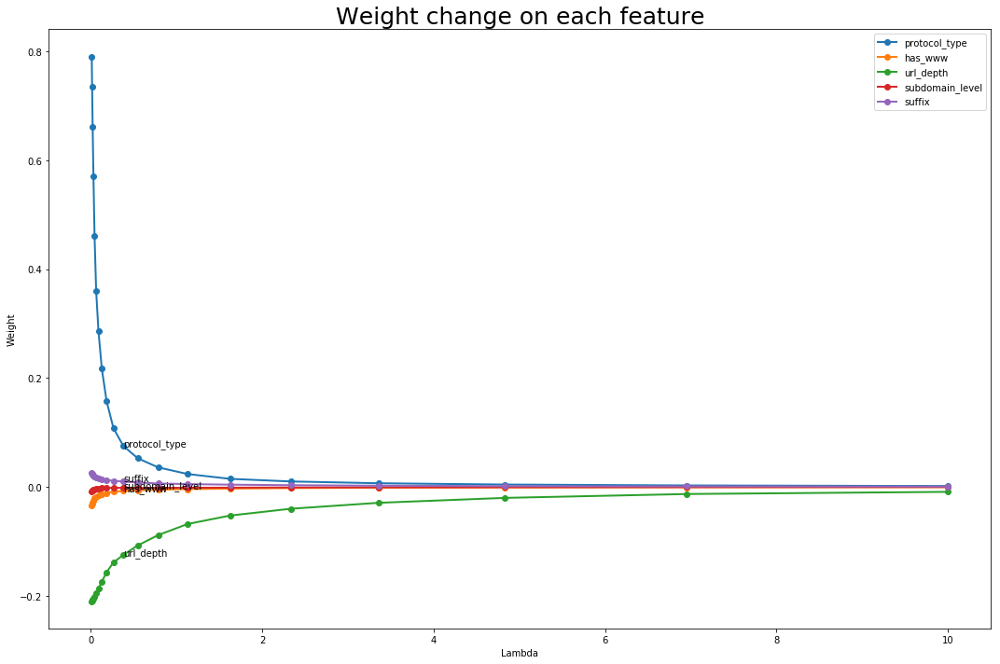

In [34]:
Visualizer.plot_importance_trending(X_train, performance_matrix, 'Weight change on each feature', 10)

<module 'matplotlib.pyplot' from '/home/jjian03/anaconda3/lib/python3.7/site-packages/matplotlib/pyplot.py'>

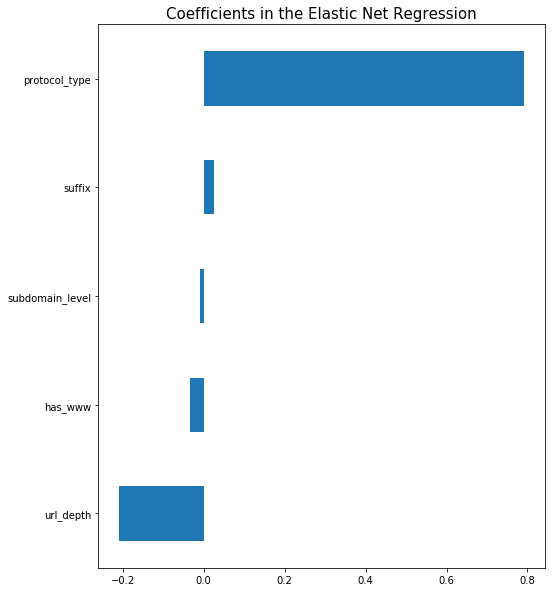

In [35]:
Visualizer.plot_feature_importance(
    model_en.best_estimator_.coef_, X_train.columns, 
    "Coefficients in the Elastic Net Regression")

##### Model - 2nd Edition

###### Try encode the suffix index label with logarithm

In [36]:
class LogarithmTransformer(BaseEstimator, TransformerMixin):
    def __init__(self, columns):
        self._columns = columns

    def fit(self,x,y=None):
        return self
        
    def transform(self,x,y=None):
        result = x
        result.loc[:, self._columns] = (result[self._columns]+0.00000000001).applymap(math.log)

        return result

pipe = Pipeline([
    ('label_builder', LabelBuilder()),
    ('url_parser', URLParser()),
    ('url_length_counter', URLLengthCounter()),
    ('url_depth_counter', URLDepthCounter()),
    ('has_www_converter', HasWWWConverter()),
    ('subdomain_level_counter', SubdomainLevelCounter()),
    ('request_parameter_counter', RequestParameterCounter()),
    ('domain_suffix_builder', DomainSuffixBuilder()),
    ('incorrect_domain_url_cleaner', IncorrectDomainUrlCleaner()),
    ('column_renamer', ColumnRenamer({'scheme': 'protocol_type'})),
    ('binary_na_encoder', BinaryNAEncoder(['content_type'])),
    ('feature_picker', FeaturePicker(['protocol_type',
                                        'url_depth',
                                        'has_www',
                                        'subdomain_level',
                                        'param_cnt',
                                        'suffix',
                                        'is_port_access',
#                                         'has_content_type',
                                        'label'
                                       ])),
    ('logarithm_transformer', LogarithmTransformer(['suffix'])),
    ('frequency_indexer', categorical_encoders.CountFrequencyCategoricalEncoder(
        encoding_method='frequency',
        variables=['protocol_type'])),
    # Low Variance Filter works incorrectly.
#     ('low_variance_remover', LowVarianceRemover(.005)), # Decreased to .005
    ('feature_remover', FeatureRemover([
                                        'param_cnt',
                                        'is_port_access',
                                       ])),
    ('standard_scaler', CustomizedStandardizer(norm='l2')),

])


X_train = pipe.fit_transform(DataSource().train_data)
y_train = X_train.label
X_train = X_train.drop('label', axis=1)
print(X_train.columns)

X_test = pipe.fit_transform(DataSource().test_data)
y_test = X_test.label
X_test = X_test.drop('label', axis=1)
print(X_test.columns)

Index(['protocol_type', 'has_www', 'url_depth', 'subdomain_level', 'suffix'], dtype='object')
Index(['protocol_type', 'has_www', 'url_depth', 'subdomain_level', 'suffix'], dtype='object')


In [37]:
start_time = time.time()
param_en = {
    'l1_ratio': [0, *np.logspace(-3, 0, 5)],
    'alpha': sorted(np.logspace(-2, 1, 20)),
    'max_iter': np.arange(10,80,40),
}


en = ElasticNet(random_state=seed,
                       warm_start=False,
)

# Start to train model
engine_en = AnalysisEngineBuilder() \
    .set_X_train(X_train) \
    .set_y_train(y_train) \
    .set_X_test(X_test) \
    .set_y_test(y_test) \
    .set_param_grid(param_en) \
    .set_engine(en) \
    .build()

model_en = engine_en.analyze()
engine_en.show_performance()

t = str(datetime.timedelta(seconds=time.time() - start_time)).split(':')
print("--- %s minutes, %.2f seconds ---" % (t[1], float(t[2])))

R^2 on Training set: 1.96%
R^2 on Testing set: 2.02%


,Coefficients,Standard Errors,t values,Probabilities
Constant,1.6406,0.142,11.589,0.000
protocol_type,0.8007,0.157,5.106,0.000
suffix,0.0319,0.041,0.785,0.432
subdomain_level,-0.0108,0.042,-0.258,0.796
has_www,-0.0401,0.084,-0.480,0.631
url_depth,-0.2114,0.038,-5.566,0.000


--- 00 minutes, 14.67 seconds ---


In [38]:
Visualizer.plot_distribution(pd.DataFrame({
    'residual': engine_en.performance_train.residual
}), "Residual Distribution", height=400)


In [39]:
residual_df_train = pd.DataFrame({
    'title': 'Training Set',
    'residual': engine_en.performance_train.residual,
    'prediction': engine_en.performance_train.pred,
})
residual_df_test = pd.DataFrame({
    'title': 'Testing Set',
    'residual': engine_en.performance_test.residual,
    'prediction': engine_en.performance_test.pred,
})

residual_df = residual_df_train.copy().append(residual_df_test)

Visualizer.plot_residual(residual_df)


In [40]:
param_en = {
    'l1_ratio': [0, *np.logspace(-3, 0, 5)],
    'alpha': sorted(np.logspace(-2, 1, 20)),
    'max_iter': np.arange(10,80,40),
}


en = ElasticNet(random_state=seed,
                       warm_start=False,
)

performance_matrix = calculate_grid_performance(X_train, y_train, X_test, y_test, param_en, en)


In [41]:
Visualizer.plot_loss_trend(performance_matrix, 'alpha', 'mse', 'type', 'MSE Trending on Train/Test Set')


In [42]:
Visualizer.plot_loss_trend(performance_matrix, 'alpha', 'r_2', 'type', 'Adjust R^2 Trending on Train/Test Set')


<module 'matplotlib.pyplot' from '/home/jjian03/anaconda3/lib/python3.7/site-packages/matplotlib/pyplot.py'>

<Figure size 576x720 with 0 Axes>

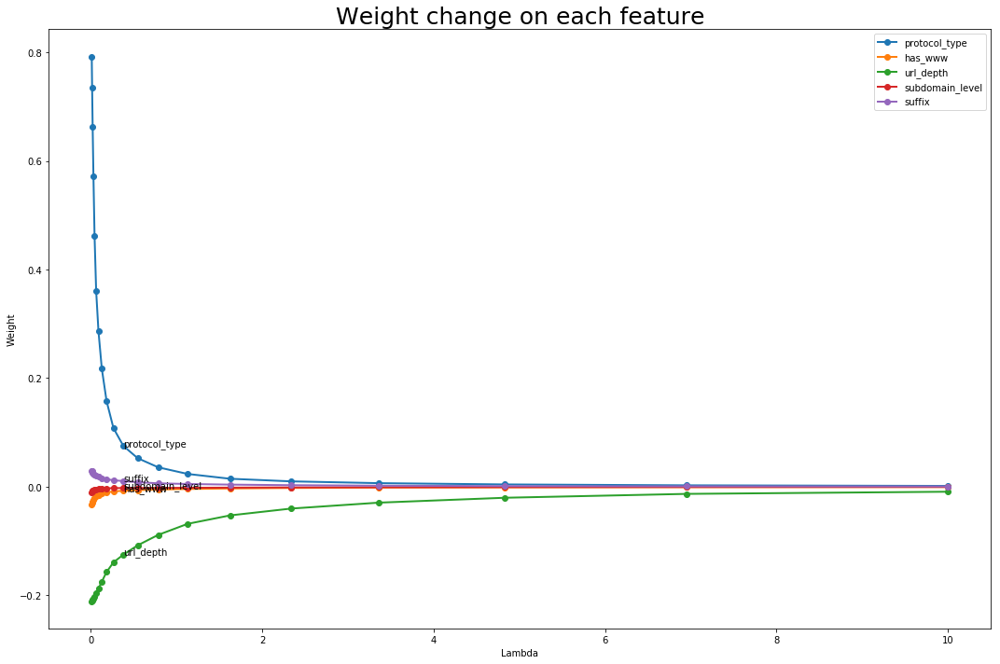

In [43]:
Visualizer.plot_importance_trending(X_train, performance_matrix, 'Weight change on each feature', 10)

<module 'matplotlib.pyplot' from '/home/jjian03/anaconda3/lib/python3.7/site-packages/matplotlib/pyplot.py'>

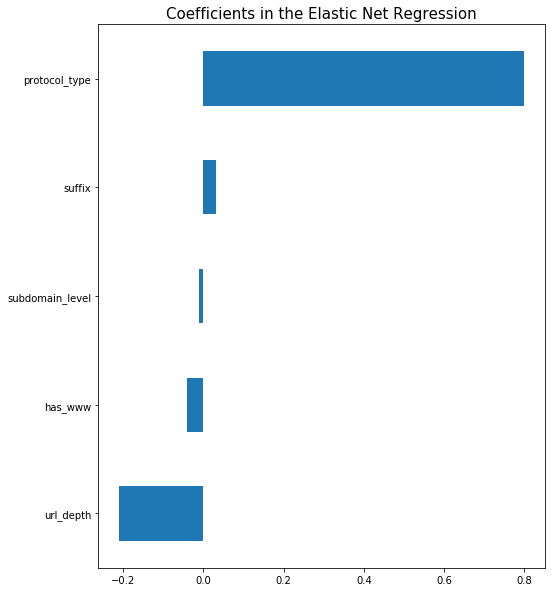

In [44]:
Visualizer.plot_feature_importance(
    model_en.best_estimator_.coef_, X_train.columns, 
    "Coefficients in the Elastic Net Regression")

##### Model - 3rd Edition

###### Try Tong's methd

In [45]:
class DummySuffixDescritizer(BaseEstimator, TransformerMixin):
    def __init__(self):
        pass

    def fit(self,x,y=None):
        return self
        
    def transform(self,x,y=None):
        result = x
        dummies = pd.get_dummies(result.suffix_idx)
        dummies = FeaturePicker(['int', 'org', 'gov', 'in', 'eu', 'cn']).fit_transform(dummies)
        result = result.drop('suffix_idx', axis = 1).join(dummies, how='inner')

        return result


pipe = Pipeline([
    ('label_builder', LabelBuilder()),
    ('url_parser', URLParser()),
    ('url_length_counter', URLLengthCounter()),
    ('url_depth_counter', URLDepthCounter()),
    ('has_www_converter', HasWWWConverter()),
    ('subdomain_level_counter', SubdomainLevelCounter()),
    ('request_parameter_counter', RequestParameterCounter()),
    ('domain_suffix_builder', DomainSuffixBuilder()),
    ('incorrect_domain_url_cleaner', IncorrectDomainUrlCleaner()),
    ('column_renamer', ColumnRenamer({'scheme': 'protocol_type'})),
    ('binary_na_encoder', BinaryNAEncoder(['content_type'])),
    ('feature_picker', FeaturePicker(['protocol_type',
                                        'url_depth',
                                        'has_www',
                                        'subdomain_level',
                                        'param_cnt',
                                        'suffix_idx',
                                        'is_port_access',
#                                         'has_content_type',
                                        'label'
                                       ])),
    ('dummy_suffix_descritizer', DummySuffixDescritizer()),
    ('frequency_indexer', categorical_encoders.CountFrequencyCategoricalEncoder(
        encoding_method='frequency',
        variables=['protocol_type'])),
    # Low Variance Filter works incorrectly.
#     ('low_variance_remover', LowVarianceRemover(.005)), # Decreased to .005
    ('feature_remover', FeatureRemover([
                                        'param_cnt',
                                        'is_port_access',
                                       ])),
    ('standard_scaler', CustomizedStandardizer(norm='l2')),

])


X_train = pipe.fit_transform(DataSource().train_data)
y_train = X_train.label
X_train = X_train.drop('label', axis=1)
print(X_train.columns)

X_test = pipe.fit_transform(DataSource().test_data)
y_test = X_test.label
X_test = X_test.drop('label', axis=1)
print(X_test.columns)

Index(['protocol_type', 'has_www', 'int', 'org', 'gov', 'in', 'eu', 'cn',
       'url_depth', 'subdomain_level'],
      dtype='object')
Index(['protocol_type', 'has_www', 'int', 'org', 'gov', 'in', 'eu', 'cn',
       'url_depth', 'subdomain_level'],
      dtype='object')


In [46]:
start_time = time.time()
param_en = {
    'l1_ratio': [0, *np.logspace(-3, 0, 5)],
    'alpha': sorted(np.logspace(-2, 1, 20)),
    'max_iter': np.arange(10,80,40),
}


en = ElasticNet(random_state=seed,
                       warm_start=False,
)


# Start to train model
engine_en = AnalysisEngineBuilder() \
    .set_X_train(X_train) \
    .set_y_train(y_train) \
    .set_X_test(X_test) \
    .set_y_test(y_test) \
    .set_param_grid(param_en) \
    .set_engine(en) \
    .build()

model_en = engine_en.analyze()
engine_en.show_performance()

t = str(datetime.timedelta(seconds=time.time() - start_time)).split(':')
print("--- %s minutes, %.2f seconds ---" % (t[1], float(t[2])))

R^2 on Training set: 2.78%
R^2 on Testing set: 2.94%


,Coefficients,Standard Errors,t values,Probabilities
Constant,1.5183,0.146,10.390,0.000
protocol_type,0.8366,0.157,5.340,0.000
gov,0.5314,0.113,4.684,0.000
in,0.2481,0.382,0.649,0.516
int,0.1826,0.255,0.716,0.474
org,0.1319,0.096,1.377,0.169
subdomain_level,-0.0042,0.042,-0.100,0.920
has_www,-0.0727,0.084,-0.868,0.385
eu,-0.1003,0.296,-0.339,0.735
cn,-0.1791,0.345,-0.519,0.604


--- 00 minutes, 16.54 seconds ---


In [47]:
Visualizer.plot_distribution(pd.DataFrame({
    'residual': engine_en.performance_train.residual
}), "Residual Distribution", height=400)

In [48]:
residual_df_train = pd.DataFrame({
    'title': 'Training Set',
    'residual': engine_en.performance_train.residual,
    'prediction': engine_en.performance_train.pred,
})
residual_df_test = pd.DataFrame({
    'title': 'Testing Set',
    'residual': engine_en.performance_test.residual,
    'prediction': engine_en.performance_test.pred,
})

residual_df = residual_df_train.copy().append(residual_df_test)

Visualizer.plot_residual(residual_df)


In [49]:
param_en = {
    'l1_ratio': [0, *np.logspace(-3, 0, 5)],
    'alpha': sorted(np.logspace(-2, 1, 20)),
    'max_iter': np.arange(10,80,40),
}


en = ElasticNet(random_state=seed,
                       warm_start=False,
)

performance_matrix = calculate_grid_performance(X_train, y_train, X_test, y_test, param_en, en)

In [50]:
Visualizer.plot_loss_trend(performance_matrix, 'alpha', 'mse', 'type', 'MSE Trending on Train/Test Set')


In [51]:
Visualizer.plot_loss_trend(performance_matrix, 'alpha', 'r_2', 'type', 'Adjust R^2 Trending on Train/Test Set')


<module 'matplotlib.pyplot' from '/home/jjian03/anaconda3/lib/python3.7/site-packages/matplotlib/pyplot.py'>

<Figure size 576x720 with 0 Axes>

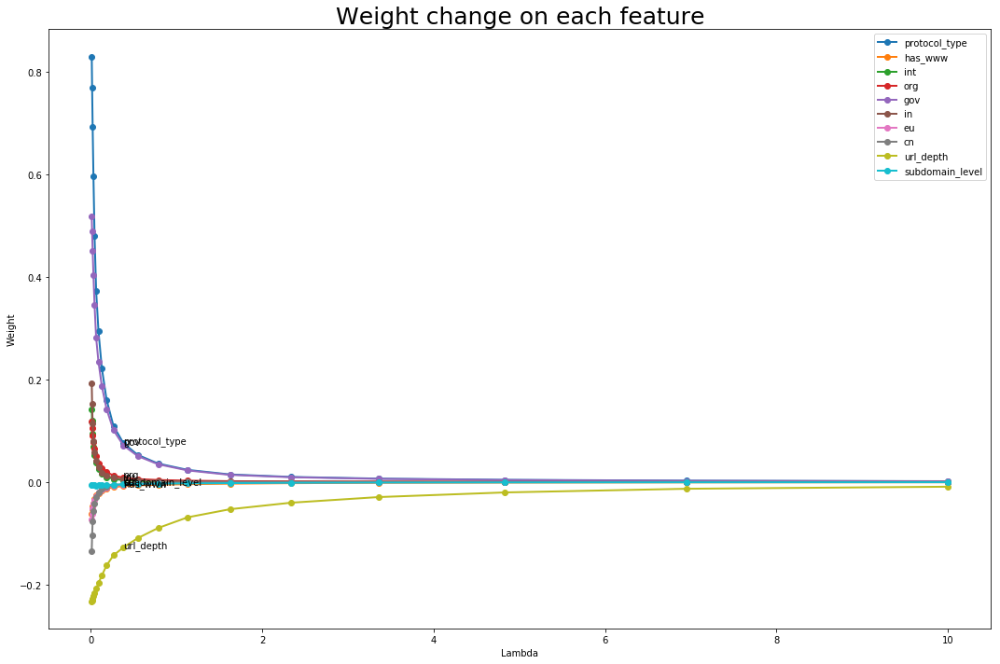

In [52]:
Visualizer.plot_importance_trending(X_train, performance_matrix, 'Weight change on each feature', 10)

<module 'matplotlib.pyplot' from '/home/jjian03/anaconda3/lib/python3.7/site-packages/matplotlib/pyplot.py'>

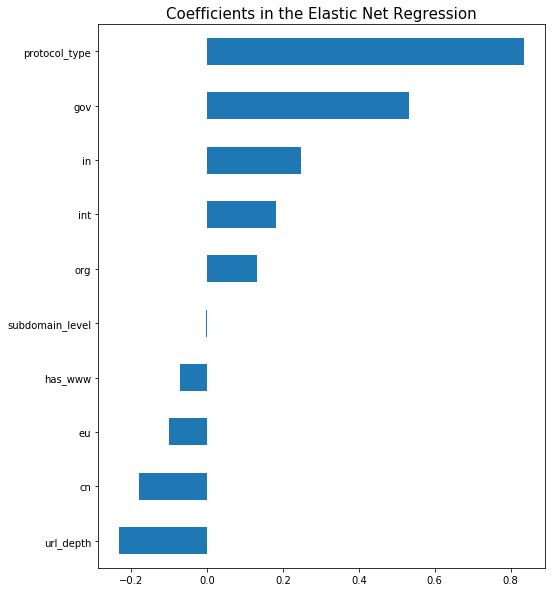

In [53]:
Visualizer.plot_feature_importance(
    model_en.best_estimator_.coef_, X_train.columns, 
    "Coefficients in the Elastic Net Regression")

##### Model - 4th Edition - Extract More Features

###### Features in source code

- Restore the test data

In [54]:
# First round pipeline

pipe_1st = Pipeline([
    ('label_builder', LabelBuilder()),
    ('url_parser', URLParser()),
    ('url_length_counter', URLLengthCounter()),
    ('url_depth_counter', URLDepthCounter()),
    ('has_www_converter', HasWWWConverter()),
    ('subdomain_level_counter', SubdomainLevelCounter()),
    ('request_parameter_counter', RequestParameterCounter()),
    ('domain_suffix_builder', DomainSuffixBuilder()),
    ('incorrect_domain_url_cleaner', IncorrectDomainUrlCleaner()),
    ('column_renamer', ColumnRenamer({'scheme': 'protocol_type'})),
])

result = pipe_1st.fit_transform(DataSource().train_data)
print(type(result))


<class 'pandas.core.frame.DataFrame'>


- Code length(kb)

In [55]:
class SourceCodeByteCounter(BaseEstimator, TransformerMixin):
    def __init__(self):
        pass

    def fit(self,x,y=None):
        return self
        
    def transform(self,x,y=None):
        result = x
        result['code_size'] = result.html_text \
            .replace(np.nan, '', regex=True) \
            .astype(str) \
            .apply(len)

        return result

pipe = Pipeline([
    ('source_code_byte_counter', SourceCodeByteCounter()),
])

print(type(result))

result = pipe.fit_transform(result)

result.code_size.head()

<class 'pandas.core.frame.DataFrame'>


4356     73067
14597     8745
5290     52302
4112     13831
1050     14585
Name: code_size, dtype: int64

- is HTML5

In [56]:
class HTML5Justifier(BaseEstimator, TransformerMixin):
    def __init__(self):
        pass

    def fit(self,x,y=None):
        return self
        
    def transform(self,x,y=None):
        result = x
        result['is_html5'] = result.html_text \
            .replace(np.nan, '', regex=True) \
            .apply(lambda x: int(x.replace('\n','').replace('\r','').strip().lower().startswith('<!doctype html>') if x else False))

        return result

pipe = Pipeline([
    ('html5_justifier', HTML5Justifier()),
])

result = pipe.fit_transform(result)

result.is_html5.head()

4356     0
14597    0
5290     0
4112     1
1050     0
Name: is_html5, dtype: int64

- Text Mining

In [57]:
class BeautifulSoupParserBuilder:

    class _BeautifulSoupParser(BaseEstimator, TransformerMixin):
        def __init__(self,_lambda_pair):
            self._lambda_pair = _lambda_pair

        def fit(self,x,y=None):
            return self

        def transform(self,x,y=None):
            result = x
            soup_handlers = result.html_text \
                    .replace(np.nan, '', regex=True) \
                    .apply(lambda html_doc: BeautifulSoupParserBuilder._safe_create_parser(html_doc))
            
            for col_name, func in self._lambda_pair.items():
                result[col_name] = soup_handlers.apply(func)

            return result

    @staticmethod
    def _safe_create_parser(html_doc):
        try:
            return BeautifulSoup(html_doc, 'html.parser')
        except:
            return BeautifulSoup('', 'html.parser')
        
    def __init__(self):
        self._lambda_pair = dict()

    def add_lambda(self, column_name, lbd):
        self._lambda_pair[column_name] = lbd
        return self

    def build(self):
        return BeautifulSoupParserBuilder._BeautifulSoupParser(self._lambda_pair)



- Title Length

In [58]:
from bs4 import BeautifulSoup


def get_title_length(soup):
    title = soup.title.string if soup.title else ''
    if not title:
        title = ''
    return len(title)


- Types of the JS library

- Extract this feature later when running the association rule.

- No of JS files

In [59]:
def count_internal_js_lib(soup):
    sources=soup.findAll('script',{"src":True})
    return len([0 for source in sources if not source['src'].startswith('http')])

def count_external_js_lib(soup):
    sources=soup.findAll('script',{"src":True})
    return len([0 for source in sources if source['src'].startswith('http')])


- Charset

In [60]:
def get_charset(soup):
    sources=soup.findAll('meta',{"charset":True})
    if 0 == len(sources):
        return ''
    return sources[0]['charset'].lower().replace('\'', '').replace('"', '')


- iFrame in Body

In [61]:
def has_iframe(soup):
    sources=soup.findAll('iframe')
    return int(0 == len(sources))


- No of hyperlink

In [62]:
def count_hyperlink(soup):
    sources=soup.findAll('a')
    return len([1 for source in sources if source.has_attr('href') and source['href'].lower().startswith('http')])


- Drop the records that does not have html code

In [63]:
class EmptyHTMLFilter(BaseEstimator, TransformerMixin):
    def __init__(self):
        pass

    def fit(self,x,y=None):
        return self
        
    def transform(self,x,y=None):
        result = x
        result = result.dropna(subset=['html_text'])

        return result

result = EmptyHTMLFilter().fit_transform(result)

- Consolidate the pipeline

In [64]:
html_parser = BeautifulSoupParserBuilder() \
    .add_lambda('title_length', get_title_length) \
    .add_lambda('internal_js_cnt', count_internal_js_lib) \
    .add_lambda('external_js_cnt', count_external_js_lib) \
    .add_lambda('charset', get_charset) \
    .add_lambda('has_iframe', has_iframe) \
    .add_lambda('hyperlink_cnt', count_hyperlink) \
    .build()

pipe = Pipeline([
    ('label_builder', LabelBuilder()),
    ('url_parser', URLParser()),
    ('url_length_counter', URLLengthCounter()),
    ('url_depth_counter', URLDepthCounter()),
    ('has_www_converter', HasWWWConverter()),
    ('subdomain_level_counter', SubdomainLevelCounter()),
    ('request_parameter_counter', RequestParameterCounter()),
    ('domain_suffix_builder', DomainSuffixBuilder()),
    ('incorrect_domain_url_cleaner', IncorrectDomainUrlCleaner()),
    ('column_renamer', ColumnRenamer({'scheme': 'protocol_type'})),
    ('source_code_byte_counter', SourceCodeByteCounter()),
    ('html5_justifier', HTML5Justifier()),
    ('empty_html_filter', EmptyHTMLFilter()),
    ('html_parser', html_parser),
    ('feature_picker', FeaturePicker(['protocol_type',
                                      'url_depth',
                                      'has_www',
                                      'subdomain_level',
                                      'param_cnt',
                                      'suffix',
                                      'is_port_access',
                                      'code_size',
                                      'title_length',
                                      'internal_js_cnt',
                                      'external_js_cnt',
                                      'charset',
                                      'is_html5',
                                      'has_iframe',
                                      'hyperlink_cnt',
                                      'html_text',
                                      'label',
                                       ])),
#     ('logarithm_transformer', LogarithmTransformer(['suffix'])),
#     ('frequency_indexer', categorical_encoders.CountFrequencyCategoricalEncoder(
#         encoding_method='frequency',
#         variables=['protocol_type'])),
    ('frequency_indexer', categorical_encoders.CountFrequencyCategoricalEncoder(
        encoding_method='frequency',
        variables=['charset'])),
#     ('low_variance_remover', LowVarianceRemover(.005)), # Decreased to .005
    ('standard_scaler', CustomizedStandardizer(norm='l2')),

])

result = pipe.fit_transform(DataSource().train_data)

result[[
    'title_length',
    'internal_js_cnt',
    'external_js_cnt',
    'charset',
    'has_iframe',
    'hyperlink_cnt']].head()

,title_length,internal_js_cnt,external_js_cnt,charset,has_iframe,hyperlink_cnt
0,3.02601,-0.408988,0.196251,0.458168,1,0.717682
1,-0.431666,-0.239141,-0.384006,-2.17751,1,-0.315847
2,0.264085,0.779942,-0.384006,0.458168,1,-0.109141
3,1.1285,-0.239141,-0.384006,-2.17751,1,-0.379449
4,-0.0943323,-0.0692938,-0.384006,0.458168,1,-0.395349


- Remove tags, Tf-Idf Score of Body

- Tf-Idf Score of Header

##### Inspect cleaned dataset

In [65]:
# result.loc[:,'charset'] = result.loc[:,'charset'].apply(lambda x: x.replace('\'', '').replace('"', ''))
# result.info()

Convert binary features into numeric variables

In [66]:
class FeatureValueMapper(BaseEstimator, TransformerMixin):
    def __init__(self, column_name, mapping):
        self._column_name = column_name
        self._mapping = mapping

    @property
    def column_name(self):
        return self._column_name

    @property
    def mapping(self):
        return self._mapping

    def fit(self,x,y=None):
        result = x
        result.loc[:,self._column_name] = result[self._column_name].map(self._mapping)
        return self
        
    def transform(self,x,y=None):
        result = x
        return result


In [67]:
pipe = Pipeline([
    ('label_builder', LabelBuilder()),
    ('url_parser', URLParser()),
    ('url_length_counter', URLLengthCounter()),
    ('url_depth_counter', URLDepthCounter()),
    ('has_www_converter', HasWWWConverter()),
    ('subdomain_level_counter', SubdomainLevelCounter()),
    ('request_parameter_counter', RequestParameterCounter()),
    ('domain_suffix_builder', DomainSuffixBuilder()),
    ('incorrect_domain_url_cleaner', IncorrectDomainUrlCleaner()),
    ('column_renamer', ColumnRenamer({'scheme': 'protocol_type'})),
    ('source_code_byte_counter', SourceCodeByteCounter()),
    ('html5_justifier', HTML5Justifier()),
#     ('empty_html_filter', EmptyHTMLFilter()),
    ('html_parser', html_parser),
    ('binary_feature_converter', FeatureValueMapper('protocol_type', {
                                        'http': 1,
                                        'https':0,
                                        })),
    ('feature_picker', FeaturePicker([
                                        'protocol_type',
                                        'url_depth',
                                        'has_www',
                                        'subdomain_level',
                                        'param_cnt',
                                        'suffix',
                                        'is_port_access',
                                        'code_size',
                                        'title_length',
                                        'internal_js_cnt',
                                        'external_js_cnt',
                                        'charset',
                                        'is_html5',
                                        'has_iframe',
                                        'hyperlink_cnt',
#                                         'html_text',
                                        'label',
                                       ])),
    ('feature_remover', FeatureRemover([
                                        'param_cnt',
                                        'is_port_access',
                                       ])),
    ('frequency_indexer', categorical_encoders.CountFrequencyCategoricalEncoder(
        encoding_method='frequency',
        variables=['charset'])),
    ('logarithm_transformer', LogarithmTransformer([
                                        'suffix',
                                        'title_length',
                                        'internal_js_cnt',
                                        'external_js_cnt',
                                        'hyperlink_cnt',
#                                         'protocol_type',
#                                         'charset'
    ])),
    ('standard_scaler', CustomizedStandardizer(norm='l2')),

])


X_train = pipe.fit_transform(DataSource().train_data)
y_train = X_train.label
print(X_train.columns)
X_train = X_train.drop('label', axis=1)
print(X_train.columns)

X_test = pipe.fit_transform(DataSource().test_data)
y_test = X_test.label
X_test = X_test.drop('label', axis=1)
print(X_test.columns)


train = X_train.copy()
train.loc[:,'label'] = y_train
test = X_test.copy()
test.loc[:,'label'] = y_test


Index(['protocol_type', 'has_www', 'is_html5', 'has_iframe', 'url_depth',
       'subdomain_level', 'suffix', 'code_size', 'title_length',
       'internal_js_cnt', 'external_js_cnt', 'charset', 'hyperlink_cnt',
       'label'],
      dtype='object')
Index(['protocol_type', 'has_www', 'is_html5', 'has_iframe', 'url_depth',
       'subdomain_level', 'suffix', 'code_size', 'title_length',
       'internal_js_cnt', 'external_js_cnt', 'charset', 'hyperlink_cnt'],
      dtype='object')
Index(['protocol_type', 'has_www', 'is_html5', 'has_iframe', 'url_depth',
       'subdomain_level', 'suffix', 'code_size', 'title_length',
       'internal_js_cnt', 'external_js_cnt', 'charset', 'hyperlink_cnt'],
      dtype='object')


In [68]:
start_time = time.time()
param_en = {
    'l1_ratio': [0, *np.logspace(-3, 0, 5)],
    'alpha': sorted(np.logspace(-2, 1, 20)),
    'max_iter': np.arange(10,80,40),
}


en = ElasticNet(random_state=seed,
                       warm_start=False,
)


# Start to train model
engine_en = AnalysisEngineBuilder() \
    .set_X_train(X_train) \
    .set_y_train(y_train) \
    .set_X_test(X_test) \
    .set_y_test(y_test) \
    .set_param_grid(param_en) \
    .set_engine(en) \
    .build()

model_en = engine_en.analyze()
engine_en.show_performance()

t = str(datetime.timedelta(seconds=time.time() - start_time)).split(':')
print("--- %s minutes, %.2f seconds ---" % (t[1], float(t[2])))

R^2 on Training set: 3.18%
R^2 on Testing set: 2.82%


,Coefficients,Standard Errors,t values,Probabilities
Constant,1.6056,0.169,9.481,0.000
protocol_type,0.6838,0.126,5.424,0.000
internal_js_cnt,0.4698,0.111,4.226,0.000
has_iframe,0.0738,0.117,0.628,0.530
suffix,0.0371,0.041,0.908,0.364
code_size,0.0217,0.038,0.575,0.565
is_html5,0.0119,0.128,0.093,0.926
subdomain_level,-0.0140,0.042,-0.333,0.739
has_www,-0.0192,0.084,-0.229,0.819
charset,-0.0615,0.053,-1.153,0.249


--- 00 minutes, 20.39 seconds ---


In [69]:
Visualizer.plot_distribution(pd.DataFrame({
    'residual': engine_en.performance_train.residual
}), "Residual Distribution", height=400)


In [70]:
residual_df_train = pd.DataFrame({
    'title': 'Training Set',
    'residual': engine_en.performance_train.residual,
    'prediction': engine_en.performance_train.pred,
})
residual_df_test = pd.DataFrame({
    'title': 'Testing Set',
    'residual': engine_en.performance_test.residual,
    'prediction': engine_en.performance_test.pred,
})

residual_df = residual_df_train.copy().append(residual_df_test)

Visualizer.plot_residual(residual_df)


In [71]:
param_en = {
    'l1_ratio': [0, *np.logspace(-3, 0, 5)],
    'alpha': sorted(np.logspace(-2, 1, 20)),
    'max_iter': np.arange(10,80,40),
}


en = ElasticNet(random_state=seed,
                       warm_start=False,
)


performance_matrix = calculate_grid_performance(X_train, y_train, X_test, y_test, param_en, en)

In [72]:
Visualizer.plot_loss_trend(performance_matrix, 'alpha', 'mse', 'type', 'MSE Trending on Train/Test Set')


In [73]:
Visualizer.plot_loss_trend(performance_matrix, 'alpha', 'r_2', 'type', 'Adjust R^2 Trending on Train/Test Set')


<module 'matplotlib.pyplot' from '/home/jjian03/anaconda3/lib/python3.7/site-packages/matplotlib/pyplot.py'>

<Figure size 576x720 with 0 Axes>

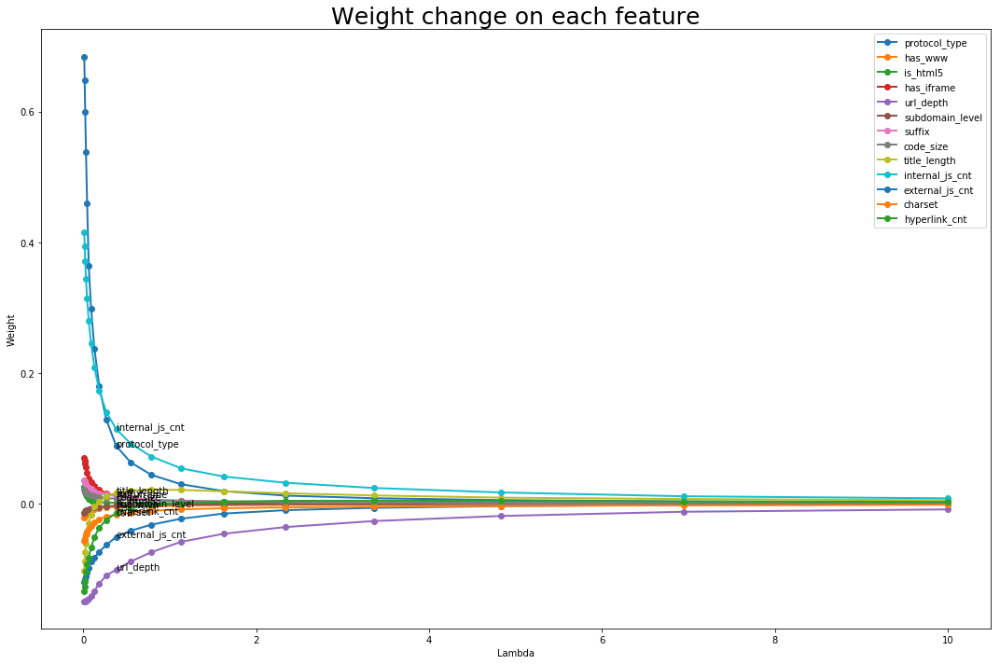

In [74]:
Visualizer.plot_importance_trending(X_train, performance_matrix, 'Weight change on each feature', 10)

<module 'matplotlib.pyplot' from '/home/jjian03/anaconda3/lib/python3.7/site-packages/matplotlib/pyplot.py'>

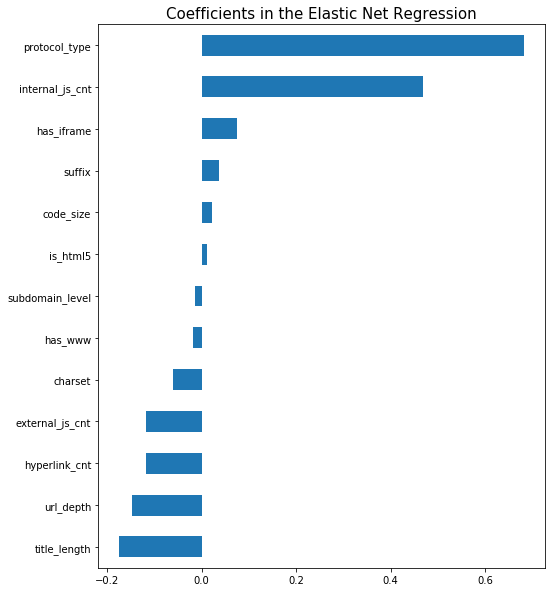

In [75]:
Visualizer.plot_feature_importance(
    model_en.best_estimator_.coef_, X_train.columns, 
    "Coefficients in the Elastic Net Regression")

##### Model - 5th Edition - Add Features From MAG

In [76]:
@singleton
class NanToZeroConverter(BaseEstimator, TransformerMixin):
    def __init__(self, columns):
        self._columns = columns

    def fit(self,x,y=None):
        return self
        
    def transform(self,x,y=None):
        result = x
        self._columns = [col_name for col_name in self._columns if col_name in result.columns]
        for col_name in self._columns:
            result.loc[:, col_name] = result[col_name].fillna(0)
        return result


In [77]:
pipe = Pipeline([
    ('label_builder', LabelBuilder()),
    ('url_parser', URLParser()),
    ('url_length_counter', URLLengthCounter()),
    ('url_depth_counter', URLDepthCounter()),
    ('has_www_converter', HasWWWConverter()),
    ('subdomain_level_counter', SubdomainLevelCounter()),
    ('request_parameter_counter', RequestParameterCounter()),
    ('domain_suffix_builder', DomainSuffixBuilder()),
    ('incorrect_domain_url_cleaner', IncorrectDomainUrlCleaner()),
    ('column_renamer', ColumnRenamer({'scheme': 'protocol_type'})),
    ('source_code_byte_counter', SourceCodeByteCounter()),
    ('html5_justifier', HTML5Justifier()),
#     ('empty_html_filter', EmptyHTMLFilter()),
    ('html_parser', html_parser),
    ('binary_feature_converter', FeatureValueMapper('protocol_type', {
                                        'http': 1,
                                        'https':0,
                                        })),

    ('nan_to_Zero_converter', NanToZeroConverter([
        'total_num_of_paper_citing',
        'total_num_of_author_citing',
        'total_num_of_affiliation_citing',
        'total_num_of_journal_citing',
        'total_num_of_author_self_citation',
        'total_num_of_affiliation_self_citation',
        'total_num_of_journal_self_citation',
        'avg_year',
        'min_year',
        'max_year',
        'median',
        'num_of_author',
        'num_of_author_citing',
        'num_of_affiliation_citing',
        'num_of_journal_citing',
        'avg_hindex',
        'first_author_hindex',
        'last_author_hindex',
        'avg_mid_author_hindex',
        'paper_unique_affiliation'
    ])),
    
    ('feature_picker', FeaturePicker([
                                        'protocol_type',
                                        'url_depth',
                                        'has_www',
                                        'subdomain_level',
                                        'param_cnt',
                                        'suffix',
                                        'is_port_access',
                                        'code_size',
                                        'title_length',
                                        'internal_js_cnt',
                                        'external_js_cnt',
                                        'charset',
                                        'is_html5',
                                        'has_iframe',
                                        'hyperlink_cnt',

                                        'total_num_of_paper_citing',
                                        'total_num_of_author_citing',
                                        'total_num_of_affiliation_citing',
                                        'total_num_of_journal_citing',
                                        'total_num_of_author_self_citation',
                                        'total_num_of_affiliation_self_citation',
                                        'total_num_of_journal_self_citation',
                                        'avg_year',
                                        'min_year',
                                        'max_year',
                                        'median',
                                        'num_of_author',
                                        'num_of_author_citing',
                                        'num_of_affiliation_citing',
                                        'num_of_journal_citing',
                                        'avg_hindex',
                                        'first_author_hindex',
                                        'last_author_hindex',
                                        'avg_mid_author_hindex',
                                        'paper_unique_affiliation',

                                        'label',
                                       ])),
    ('feature_remover', FeatureRemover([
                                        'param_cnt',
                                        'is_port_access',
                                       ])),
    ('frequency_indexer', categorical_encoders.CountFrequencyCategoricalEncoder(
        encoding_method='frequency',
        variables=['charset'])),
    ('logarithm_transformer', LogarithmTransformer([
                                        'suffix',
                                        'title_length',
                                        'internal_js_cnt',
                                        'external_js_cnt',
                                        'hyperlink_cnt',
#                                         'protocol_type',
#                                         'charset'
    ])),
    ('standard_scaler', CustomizedStandardizer(norm='l2')),

])

X_train = pipe.fit_transform(DataSource().train_data)
y_train = X_train.label
X_train = X_train.drop('label', axis=1)
print(X_train.columns)

X_test = pipe.fit_transform(DataSource().test_data)
y_test = X_test.label
X_test = X_test.drop('label', axis=1)
print(X_test.columns)


train = X_train.copy()
train.loc[:,'label'] = y_train
test = X_test.copy()
test.loc[:,'label'] = y_test


Index(['protocol_type', 'has_www', 'is_html5', 'has_iframe', 'url_depth',
       'subdomain_level', 'suffix', 'code_size', 'title_length',
       'internal_js_cnt', 'external_js_cnt', 'charset', 'hyperlink_cnt',
       'total_num_of_paper_citing', 'total_num_of_author_citing',
       'total_num_of_affiliation_citing', 'total_num_of_journal_citing',
       'total_num_of_author_self_citation',
       'total_num_of_affiliation_self_citation',
       'total_num_of_journal_self_citation', 'avg_year', 'min_year',
       'max_year', 'median', 'num_of_author', 'num_of_author_citing',
       'num_of_affiliation_citing', 'num_of_journal_citing', 'avg_hindex',
       'first_author_hindex', 'last_author_hindex', 'avg_mid_author_hindex',
       'paper_unique_affiliation'],
      dtype='object')
Index(['protocol_type', 'has_www', 'is_html5', 'has_iframe', 'url_depth',
       'subdomain_level', 'suffix', 'code_size', 'title_length',
       'internal_js_cnt', 'external_js_cnt', 'charset', 'hyperlink_c

In [78]:
start_time = time.time()
param_en = {
    'l1_ratio': [0, *np.logspace(-3, 0, 5)],
    'alpha': sorted(np.logspace(-2, 1, 20)),
    'max_iter': np.arange(10,80,40),
}


en = ElasticNet(random_state=seed,
                       warm_start=False,
)


# Start to train model
engine_en = AnalysisEngineBuilder() \
    .set_X_train(X_train) \
    .set_y_train(y_train) \
    .set_X_test(X_test) \
    .set_y_test(y_test) \
    .set_param_grid(param_en) \
    .set_engine(en) \
    .build()

model_en = engine_en.analyze()
engine_en.show_performance()

t = str(datetime.timedelta(seconds=time.time() - start_time)).split(':')
print("--- %s minutes, %.2f seconds ---" % (t[1], float(t[2])))

R^2 on Training set: 5.08%
R^2 on Testing set: 2.87%


,Coefficients,Standard Errors,t values,Probabilities
Constant,1.7338,0.171,10.153,0.000
protocol_type,0.6023,0.127,4.736,0.000
internal_js_cnt,0.3726,0.112,3.334,0.001
total_num_of_paper_citing,0.3494,0.302,1.155,0.248
num_of_author_citing,0.1792,0.148,1.215,0.225
total_num_of_author_self_citation,0.1034,0.069,1.500,0.134
total_num_of_journal_citing,0.0654,0.316,0.207,0.836
total_num_of_journal_self_citation,0.0358,0.040,0.887,0.375
suffix,0.0225,0.041,0.547,0.585
code_size,0.0154,0.038,0.406,0.685


--- 00 minutes, 31.84 seconds ---


In [79]:
Visualizer.plot_distribution(pd.DataFrame({
    'residual': engine_en.performance_train.residual
}), "Residual Distribution", height=400)

In [80]:
residual_df_train = pd.DataFrame({
    'title': 'Training Set',
    'residual': engine_en.performance_train.residual,
    'prediction': engine_en.performance_train.pred,
})
residual_df_test = pd.DataFrame({
    'title': 'Testing Set',
    'residual': engine_en.performance_test.residual,
    'prediction': engine_en.performance_test.pred,
})

residual_df = residual_df_train.copy().append(residual_df_test)

Visualizer.plot_residual(residual_df)


In [81]:
param_en = {
    'l1_ratio': [0, *np.logspace(-3, 0, 5)],
    'alpha': sorted(np.logspace(-2, 1, 20)),
    'max_iter': np.arange(10,80,40),
}


en = ElasticNet(random_state=seed,
                       warm_start=False,
)


performance_matrix = calculate_grid_performance(X_train, y_train, X_test, y_test, param_en, en)

In [82]:
Visualizer.plot_loss_trend(performance_matrix, 'alpha', 'mse', 'type', 'MSE Trending on Train/Test Set')


In [83]:
Visualizer.plot_loss_trend(performance_matrix, 'alpha', 'r_2', 'type', 'Adjust R^2 Trending on Train/Test Set')


<module 'matplotlib.pyplot' from '/home/jjian03/anaconda3/lib/python3.7/site-packages/matplotlib/pyplot.py'>

<Figure size 576x720 with 0 Axes>

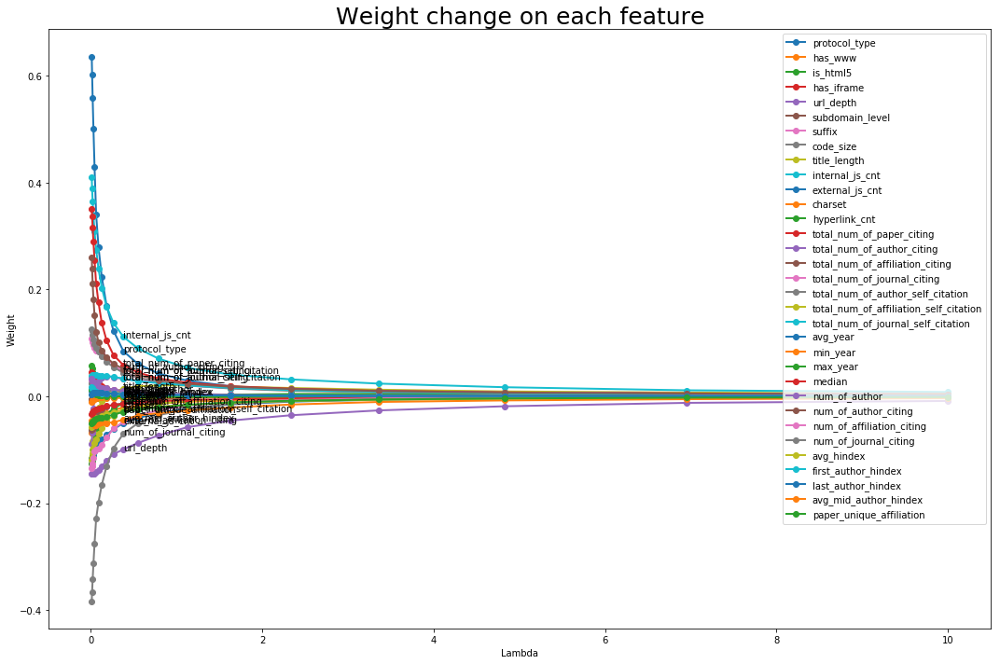

In [84]:
Visualizer.plot_importance_trending(X_train, performance_matrix, 'Weight change on each feature', 10)

<module 'matplotlib.pyplot' from '/home/jjian03/anaconda3/lib/python3.7/site-packages/matplotlib/pyplot.py'>

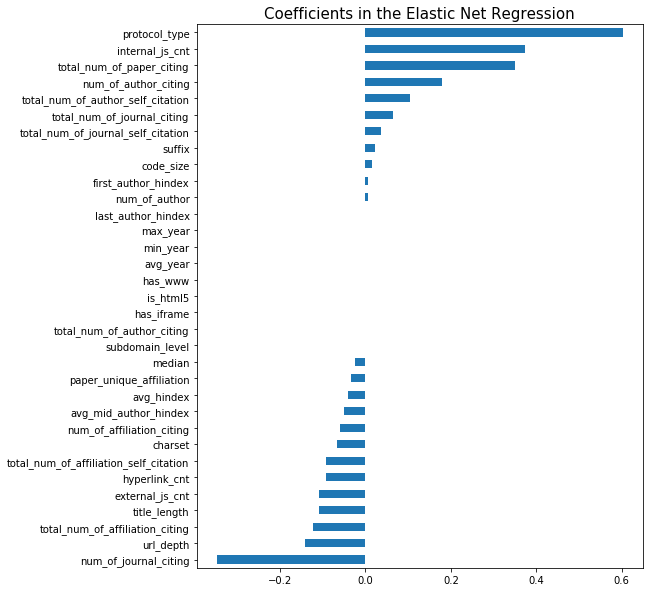

In [85]:
Visualizer.plot_feature_importance(
    model_en.best_estimator_.coef_, X_train.columns, 
    "Coefficients in the Elastic Net Regression")

##### 6th Edition - Combine suffix dummy with MAG

In [86]:
pipe = Pipeline([
    ('label_builder', LabelBuilder()),
    ('url_parser', URLParser()),
    ('url_length_counter', URLLengthCounter()),
    ('url_depth_counter', URLDepthCounter()),
    ('has_www_converter', HasWWWConverter()),
    ('subdomain_level_counter', SubdomainLevelCounter()),
    ('request_parameter_counter', RequestParameterCounter()),
    ('domain_suffix_builder', DomainSuffixBuilder()),
    ('incorrect_domain_url_cleaner', IncorrectDomainUrlCleaner()),
    ('column_renamer', ColumnRenamer({'scheme': 'protocol_type'})),
    ('binary_na_encoder', BinaryNAEncoder(['content_type'])),
    ('html_parser', html_parser),
    ('binary_feature_converter', FeatureValueMapper('protocol_type', {
                                        'http': 1,
                                        'https':0,
                                        })),

    ('nan_to_Zero_converter', NanToZeroConverter([
        'total_num_of_paper_citing',
        'total_num_of_author_citing',
        'total_num_of_affiliation_citing',
        'total_num_of_journal_citing',
        'total_num_of_author_self_citation',
        'total_num_of_affiliation_self_citation',
        'total_num_of_journal_self_citation',
        'avg_year',
        'min_year',
        'max_year',
        'median',
        'num_of_author',
        'num_of_author_citing',
        'num_of_affiliation_citing',
        'num_of_journal_citing',
        'avg_hindex',
        'first_author_hindex',
        'last_author_hindex',
        'avg_mid_author_hindex',
        'paper_unique_affiliation'
    ])),
    
    ('feature_picker', FeaturePicker([
                                        'protocol_type',
                                        'url_depth',
                                        'has_www',
                                        'subdomain_level',
                                        'param_cnt',
                                        'suffix_idx',
                                        'is_port_access',
                                        'code_size',
                                        'title_length',
                                        'internal_js_cnt',
                                        'external_js_cnt',
                                        'charset',
                                        'is_html5',
                                        'has_iframe',
                                        'hyperlink_cnt',

                                        'total_num_of_paper_citing',
                                        'total_num_of_author_citing',
                                        'total_num_of_affiliation_citing',
                                        'total_num_of_journal_citing',
                                        'total_num_of_author_self_citation',
                                        'total_num_of_affiliation_self_citation',
                                        'total_num_of_journal_self_citation',
                                        'avg_year',
                                        'min_year',
                                        'max_year',
                                        'median',
                                        'num_of_author',
                                        'num_of_author_citing',
                                        'num_of_affiliation_citing',
                                        'num_of_journal_citing',
                                        'avg_hindex',
                                        'first_author_hindex',
                                        'last_author_hindex',
                                        'avg_mid_author_hindex',
                                        'paper_unique_affiliation',

                                        'label',
                                       ])),
    ('dummy_suffix_descritizer', DummySuffixDescritizer()),

    ('feature_remover', FeatureRemover([
                                        'is_port_access',
                                       ])),
    ('frequency_indexer', categorical_encoders.CountFrequencyCategoricalEncoder(
        encoding_method='frequency',
        variables=['charset'])),
    ('standard_scaler', CustomizedStandardizer(norm='l2')),

])

X_train = pipe.fit_transform(DataSource().train_data)
y_train = X_train.label
X_train = X_train.drop('label', axis=1)
print(X_train.columns)

X_test = pipe.fit_transform(DataSource().test_data)
y_test = X_test.label
X_test = X_test.drop('label', axis=1)
print(X_test.columns)


train = X_train.copy()
train.loc[:,'label'] = y_train
test = X_test.copy()
test.loc[:,'label'] = y_test


Index(['protocol_type', 'has_www', 'has_iframe', 'int', 'org', 'gov', 'in',
       'eu', 'cn', 'url_depth', 'subdomain_level', 'param_cnt', 'title_length',
       'internal_js_cnt', 'external_js_cnt', 'charset', 'hyperlink_cnt',
       'total_num_of_paper_citing', 'total_num_of_author_citing',
       'total_num_of_affiliation_citing', 'total_num_of_journal_citing',
       'total_num_of_author_self_citation',
       'total_num_of_affiliation_self_citation',
       'total_num_of_journal_self_citation', 'avg_year', 'min_year',
       'max_year', 'median', 'num_of_author', 'num_of_author_citing',
       'num_of_affiliation_citing', 'num_of_journal_citing', 'avg_hindex',
       'first_author_hindex', 'last_author_hindex', 'avg_mid_author_hindex',
       'paper_unique_affiliation'],
      dtype='object')
Index(['protocol_type', 'has_www', 'has_iframe', 'int', 'org', 'gov', 'in',
       'eu', 'cn', 'url_depth', 'subdomain_level', 'param_cnt', 'title_length',
       'internal_js_cnt', 'externa

In [87]:
start_time = time.time()
param_en = {
    'l1_ratio': [0, *np.logspace(-3, 0, 5)],
    'alpha': sorted(np.logspace(-2, 1, 20)),
    'max_iter': np.arange(10,80,40),
}


en = ElasticNet(random_state=seed,
                       warm_start=False,
)


# Start to train model
engine_en = AnalysisEngineBuilder() \
    .set_X_train(X_train) \
    .set_y_train(y_train) \
    .set_X_test(X_test) \
    .set_y_test(y_test) \
    .set_param_grid(param_en) \
    .set_engine(en) \
    .build()

model_en = engine_en.analyze()
engine_en.show_performance()

t = str(datetime.timedelta(seconds=time.time() - start_time)).split(':')
print("--- %s minutes, %.2f seconds ---" % (t[1], float(t[2])))

R^2 on Training set: 4.7%
R^2 on Testing set: 3.14%


,Coefficients,Standard Errors,t values,Probabilities
Constant,1.6717,0.168,9.943,0.000
protocol_type,0.6063,0.127,4.759,0.000
gov,0.3943,0.116,3.386,0.001
total_num_of_paper_citing,0.3339,0.303,1.103,0.270
num_of_author_citing,0.1554,0.147,1.054,0.292
total_num_of_author_self_citation,0.0994,0.069,1.444,0.149
total_num_of_journal_self_citation,0.0422,0.040,1.046,0.296
total_num_of_journal_citing,0.0098,0.317,0.031,0.975
org,0.0075,0.097,0.077,0.938
internal_js_cnt,0.0021,0.042,0.051,0.960


--- 00 minutes, 35.02 seconds ---


In [88]:
Visualizer.plot_distribution(pd.DataFrame({
    'residual': engine_en.performance_train.residual
}), "Residual Distribution", height=400)

In [89]:
residual_df_train = pd.DataFrame({
    'title': 'Training Set',
    'residual': engine_en.performance_train.residual,
    'prediction': engine_en.performance_train.pred,
})
residual_df_test = pd.DataFrame({
    'title': 'Testing Set',
    'residual': engine_en.performance_test.residual,
    'prediction': engine_en.performance_test.pred,
})

residual_df = residual_df_train.copy().append(residual_df_test)

Visualizer.plot_residual(residual_df)


In [90]:
param_en = {
    'l1_ratio': [0, *np.logspace(-3, 0, 5)],
    'alpha': sorted(np.logspace(-2, 1, 20)),
    'max_iter': np.arange(10,80,40),
}


en = ElasticNet(random_state=seed,
                       warm_start=False,
)


performance_matrix = calculate_grid_performance(X_train, y_train, X_test, y_test, param_en, en)

In [91]:
Visualizer.plot_loss_trend(performance_matrix, 'alpha', 'mse', 'type', 'MSE Trending on Train/Test Set')


In [92]:
Visualizer.plot_loss_trend(performance_matrix, 'alpha', 'r_2', 'type', 'Adjust R^2 Trending on Train/Test Set')


<module 'matplotlib.pyplot' from '/home/jjian03/anaconda3/lib/python3.7/site-packages/matplotlib/pyplot.py'>

<Figure size 576x720 with 0 Axes>

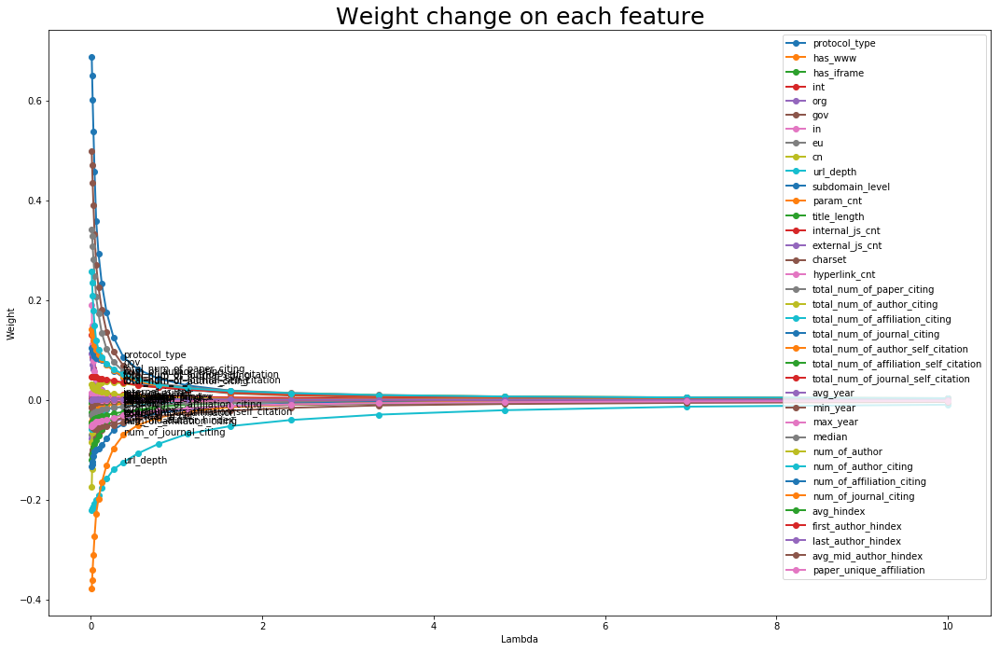

In [93]:
Visualizer.plot_importance_trending(X_train, performance_matrix, 'Weight change on each feature', 10)

<module 'matplotlib.pyplot' from '/home/jjian03/anaconda3/lib/python3.7/site-packages/matplotlib/pyplot.py'>

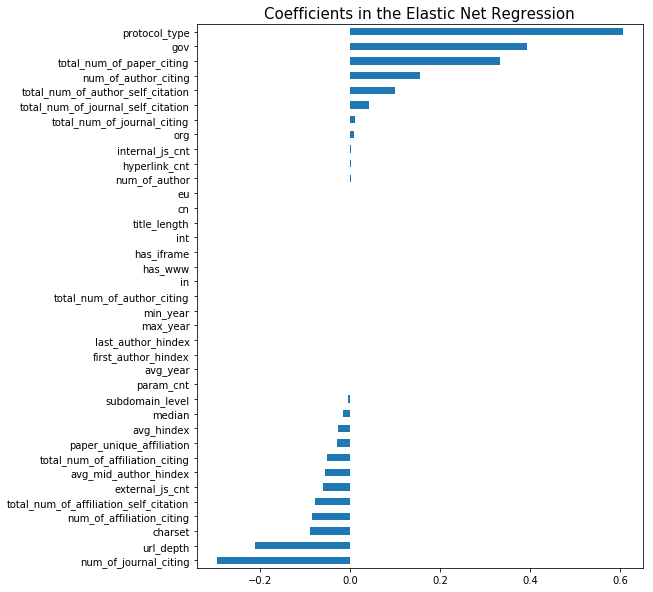

In [94]:
Visualizer.plot_feature_importance(
    model_en.best_estimator_.coef_, X_train.columns, 
    "Coefficients in the Elastic Net Regression")

##### Model 7th - Lasso Regression to Select Features

In [95]:
from sklearn.linear_model import Lasso


param_lso = {
    'alpha': sorted(np.logspace(-2, -1, 20)),
    'max_iter': np.arange(10,80,40),
}


lso = Lasso(random_state=seed)


performance_matrix = calculate_grid_performance(X_train, y_train, X_test, y_test, param_lso, lso)

In [96]:
Visualizer.plot_loss_trend(performance_matrix, 'alpha', 'mse', 'type', 'MSE Trending on Train/Test Set')


In [97]:
Visualizer.plot_loss_trend(performance_matrix, 'alpha', 'r_2', 'type', 'Adjust R^2 Trending on Train/Test Set')


<module 'matplotlib.pyplot' from '/home/jjian03/anaconda3/lib/python3.7/site-packages/matplotlib/pyplot.py'>

<Figure size 576x720 with 0 Axes>

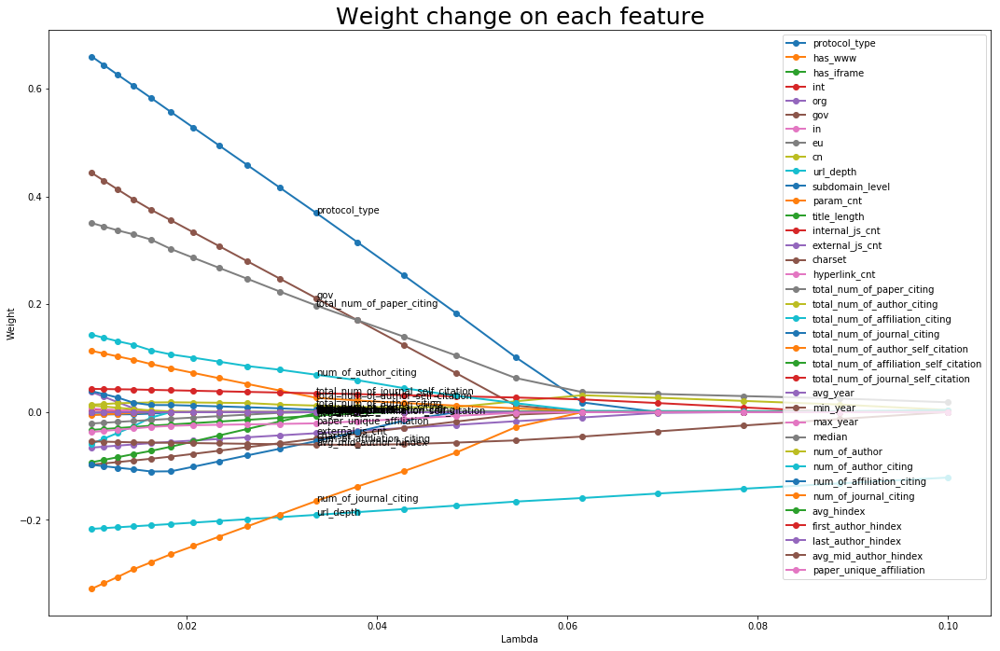

In [98]:
Visualizer.plot_importance_trending(X_train, performance_matrix, 'Weight change on each feature', 10)

In [99]:
start_time = time.time()
param_lso = {
    'alpha': [0.059],
    'max_iter': np.arange(10,80,40),
}


lso = Lasso(random_state=seed)


# Start to train model
engine_lso = AnalysisEngineBuilder() \
    .set_X_train(X_train) \
    .set_y_train(y_train) \
    .set_X_test(X_test) \
    .set_y_test(y_test) \
    .set_param_grid(param_lso) \
    .set_engine(lso) \
    .build()

model_lso = engine_lso.analyze()
engine_lso.show_performance()

t = str(datetime.timedelta(seconds=time.time() - start_time)).split(':')
print("--- %s minutes, %.2f seconds ---" % (t[1], float(t[2])))

R^2 on Training set: 1.56%
R^2 on Testing set: 1.07%


,Coefficients,Standard Errors,t values,Probabilities
Constant,2.2373,0.170,13.167,0.000
protocol_type,0.0477,0.129,0.370,0.711
total_num_of_paper_citing,0.0375,0.306,0.123,0.902
total_num_of_author_citing,0.0335,0.152,0.220,0.826
total_num_of_journal_self_citation,0.0252,0.041,0.616,0.538
total_num_of_author_self_citation,0.0035,0.070,0.050,0.960
num_of_author_citing,0.0016,0.149,0.011,0.992
int,0.0000,0.261,0.000,1.000
org,0.0000,0.098,0.000,1.000
last_author_hindex,0.0000,0.024,0.000,1.000


--- 00 minutes, 0.29 seconds ---


In [100]:
rpt = engine_lso.performance_test.statistic_rpt


In [101]:
rpt[rpt.Coefficients == 0]

,Coefficients,Standard Errors,t values,Probabilities
int,0.0,0.261,0.0,1.0
org,0.0,0.098,0.0,1.0
last_author_hindex,0.0,0.024,0.0,1.0
first_author_hindex,0.0,0.024,0.0,1.0
avg_hindex,-0.0,0.057,-0.0,1.0
num_of_journal_citing,-0.0,0.099,-0.0,1.0
num_of_affiliation_citing,-0.0,0.165,-0.0,1.0
num_of_author,0.0,0.076,0.0,1.0
median,-0.0,0.038,-0.0,1.0
max_year,-0.0,3.649,-0.0,1.0


In [102]:
rpt.sort_values(by=['Probabilities', 'Standard Errors'])

,Coefficients,Standard Errors,t values,Probabilities
url_depth,-0.1617,0.040,-4.024,0.000
Constant,2.2373,0.170,13.167,0.000
avg_mid_author_hindex,-0.0487,0.050,-0.973,0.331
total_num_of_journal_self_citation,0.0252,0.041,0.616,0.538
protocol_type,0.0477,0.129,0.370,0.711
external_js_cnt,-0.0124,0.042,-0.297,0.766
total_num_of_author_citing,0.0335,0.152,0.220,0.826
total_num_of_paper_citing,0.0375,0.306,0.123,0.902
total_num_of_author_self_citation,0.0035,0.070,0.050,0.960
num_of_author_citing,0.0016,0.149,0.011,0.992


<module 'matplotlib.pyplot' from '/home/jjian03/anaconda3/lib/python3.7/site-packages/matplotlib/pyplot.py'>

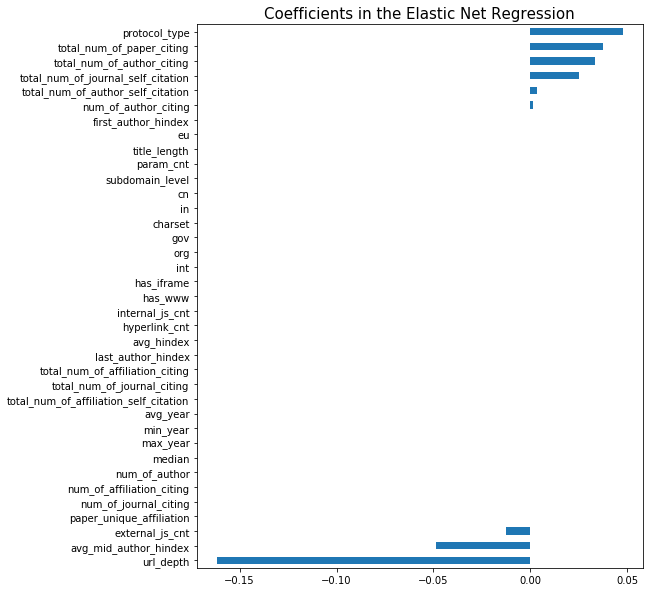

In [103]:
Visualizer.plot_feature_importance(
    model_lso.best_estimator_.coef_, X_train.columns, 
    "Coefficients in the Elastic Net Regression")

##### 8th Edition - Use Selected Features to run Lasso Regression Again

- Manually select features

In [107]:
features = set(tuple([
    'org',
    'gov',
    'int',
    'in',
    'cn',
    'eu',
]))

for col_name in rpt[rpt.Coefficients != 0].index.tolist():
    features.add(col_name)

features.remove('Constant')

In [108]:
from sklearn.linear_model import Lasso


param_lso = {
    'alpha': sorted(np.logspace(-2, -1, 20)),
    'max_iter': np.arange(10,80,40),
}


lso = Lasso(random_state=seed)


performance_matrix = calculate_grid_performance(X_train[features], y_train, X_test[features], y_test, param_lso, lso)

<module 'matplotlib.pyplot' from '/home/jjian03/anaconda3/lib/python3.7/site-packages/matplotlib/pyplot.py'>

<Figure size 576x720 with 0 Axes>

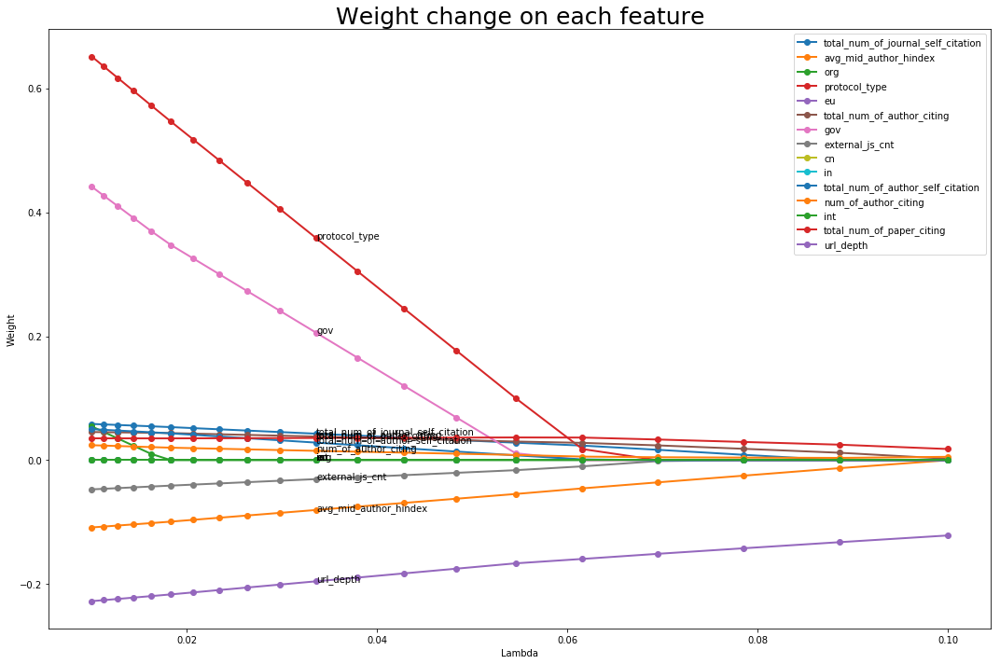

In [109]:
Visualizer.plot_importance_trending(X_train[features], performance_matrix, 'Weight change on each feature', 10)

In [110]:
start_time = time.time()
param_lso = {
    'alpha': [0.059],
    'max_iter': np.arange(10,80,40),
}


lso = Lasso(random_state=seed)


# Start to train model
engine_lso = AnalysisEngineBuilder() \
    .set_X_train(X_train[features]) \
    .set_y_train(y_train) \
    .set_X_test(X_test[features]) \
    .set_y_test(y_test) \
    .set_param_grid(param_lso) \
    .set_engine(lso) \
    .build()

model_lso = engine_lso.analyze()
engine_lso.show_performance()

t = str(datetime.timedelta(seconds=time.time() - start_time)).split(':')
print("--- %s minutes, %.2f seconds ---" % (t[1], float(t[2])))

R^2 on Training set: 1.56%
R^2 on Testing set: 1.07%


,Coefficients,Standard Errors,t values,Probabilities
Constant,2.2372,0.127,17.623,0.000
protocol_type,0.0478,0.126,0.379,0.705
total_num_of_paper_citing,0.0365,0.063,0.582,0.561
total_num_of_author_citing,0.0282,0.099,0.283,0.777
total_num_of_journal_self_citation,0.0252,0.040,0.632,0.527
num_of_author_citing,0.0074,0.111,0.067,0.947
total_num_of_author_self_citation,0.0038,0.050,0.076,0.940
org,0.0000,0.089,0.000,1.000
eu,-0.0000,0.299,-0.000,1.000
gov,0.0000,0.114,0.000,1.000


--- 00 minutes, 0.21 seconds ---


In [111]:
rpt = engine_lso.performance_test.statistic_rpt


In [112]:
rpt[rpt.Coefficients == 0]

,Coefficients,Standard Errors,t values,Probabilities
org,0.0,0.089,0.0,1.0
eu,-0.0,0.299,-0.0,1.0
gov,0.0,0.114,0.0,1.0
cn,-0.0,0.348,-0.0,1.0
in,0.0,0.387,0.0,1.0
int,0.0,0.258,0.0,1.0


In [113]:
rpt.sort_values(by=['Probabilities', 'Standard Errors'])

,Coefficients,Standard Errors,t values,Probabilities
url_depth,-0.1617,0.039,-4.170,0.000
Constant,2.2372,0.127,17.623,0.000
avg_mid_author_hindex,-0.0489,0.040,-1.224,0.221
total_num_of_journal_self_citation,0.0252,0.040,0.632,0.527
total_num_of_paper_citing,0.0365,0.063,0.582,0.561
protocol_type,0.0478,0.126,0.379,0.705
external_js_cnt,-0.0123,0.038,-0.324,0.746
total_num_of_author_citing,0.0282,0.099,0.283,0.777
total_num_of_author_self_citation,0.0038,0.050,0.076,0.940
num_of_author_citing,0.0074,0.111,0.067,0.947


<module 'matplotlib.pyplot' from '/home/jjian03/anaconda3/lib/python3.7/site-packages/matplotlib/pyplot.py'>

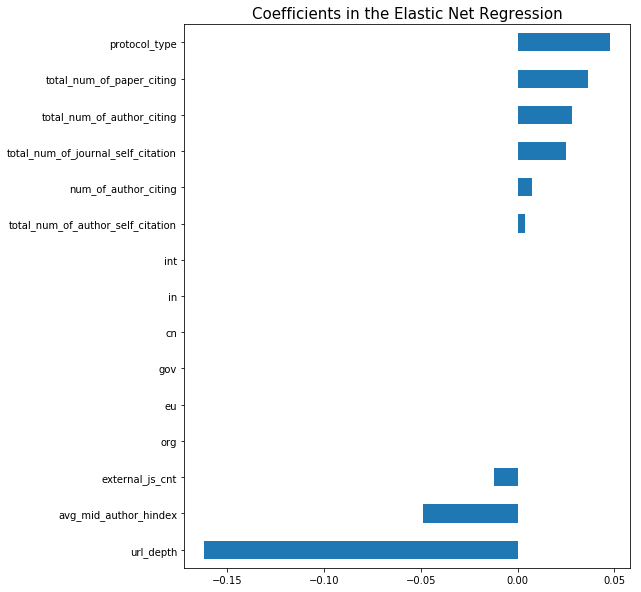

In [114]:
Visualizer.plot_feature_importance(
    model_lso.best_estimator_.coef_, X_train[features].columns, 
    "Coefficients in the Elastic Net Regression")

##### 8th Edition - Retrain the Elastic Net Regressor with Selected Features

In [115]:
features = rpt[rpt.Coefficients != 0].index.tolist()[1:]
features

['protocol_type',
 'total_num_of_paper_citing',
 'total_num_of_author_citing',
 'total_num_of_journal_self_citation',
 'num_of_author_citing',
 'total_num_of_author_self_citation',
 'external_js_cnt',
 'avg_mid_author_hindex',
 'url_depth']

In [116]:
param_en = {
    'l1_ratio': [0, *np.logspace(-3, 0, 5)],
    'alpha': sorted(np.logspace(-2, 1, 20)),
    'max_iter': np.arange(10,80,40),
}


en = ElasticNet(random_state=seed,
                       warm_start=False,
)


performance_matrix = calculate_grid_performance(X_train[features], y_train, X_test[features], y_test, param_en, en)

In [117]:
Visualizer.plot_loss_trend(performance_matrix, 'alpha', 'mse', 'type', 'MSE Trending on Train/Test Set')


In [118]:
Visualizer.plot_loss_trend(performance_matrix, 'alpha', 'r_2', 'type', 'Adjust R^2 Trending on Train/Test Set')


<module 'matplotlib.pyplot' from '/home/jjian03/anaconda3/lib/python3.7/site-packages/matplotlib/pyplot.py'>

<Figure size 576x720 with 0 Axes>

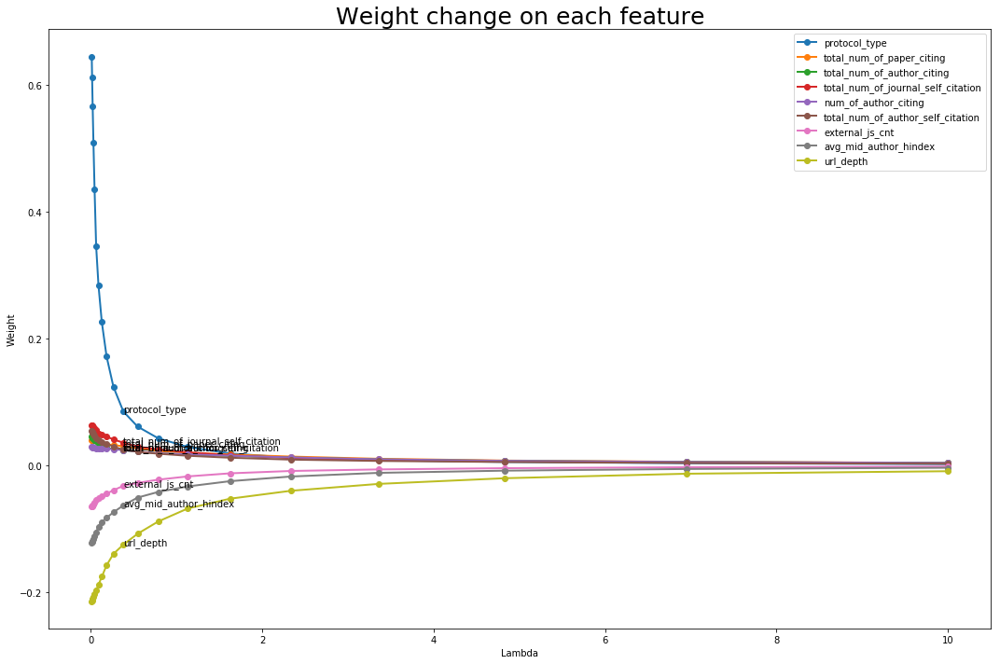

In [119]:
Visualizer.plot_importance_trending(X_train[features], performance_matrix, 'Weight change on each feature', 10)

In [120]:
start_time = time.time()
param_en = {
    'l1_ratio': [0, *np.logspace(-3, 0, 5)],
    'alpha': sorted(np.logspace(-2, 1, 20)),
    'max_iter': np.arange(10,80,40),
}


en = ElasticNet(random_state=seed,
                       warm_start=False,
)


# Start to train model
engine_en = AnalysisEngineBuilder() \
    .set_X_train(X_train[features]) \
    .set_y_train(y_train) \
    .set_X_test(X_test[features]) \
    .set_y_test(y_test) \
    .set_param_grid(param_en) \
    .set_engine(en) \
    .build()

model_en = engine_en.analyze()
engine_en.show_performance()

t = str(datetime.timedelta(seconds=time.time() - start_time)).split(':')
print("--- %s minutes, %.2f seconds ---" % (t[1], float(t[2])))

R^2 on Training set: 2.72%
R^2 on Testing set: 1.64%


,Coefficients,Standard Errors,t values,Probabilities
Constant,1.6944,0.119,14.288,0.000
protocol_type,0.6456,0.125,5.160,0.000
total_num_of_journal_self_citation,0.0633,0.040,1.595,0.111
total_num_of_author_citing,0.0562,0.099,0.569,0.570
total_num_of_author_self_citation,0.0539,0.049,1.090,0.276
total_num_of_paper_citing,0.0408,0.062,0.654,0.513
num_of_author_citing,0.0179,0.110,0.163,0.871
external_js_cnt,-0.0652,0.038,-1.733,0.083
avg_mid_author_hindex,-0.1224,0.040,-3.082,0.002
url_depth,-0.2141,0.038,-5.678,0.000


--- 00 minutes, 17.39 seconds ---


<module 'matplotlib.pyplot' from '/home/jjian03/anaconda3/lib/python3.7/site-packages/matplotlib/pyplot.py'>

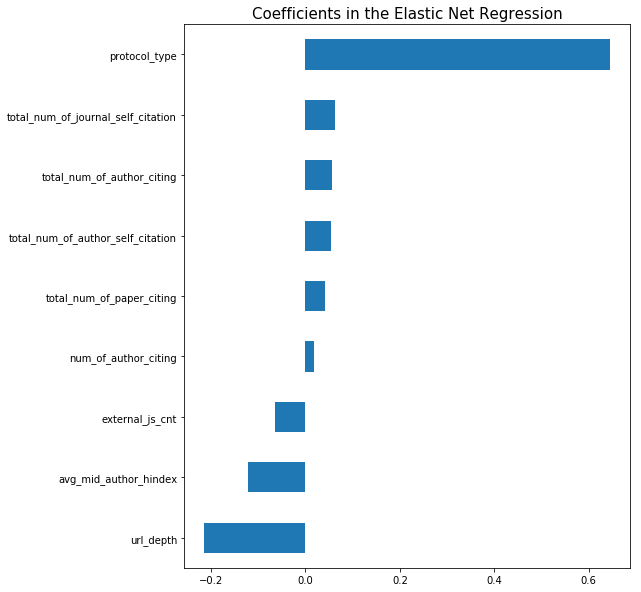

In [121]:
Visualizer.plot_feature_importance(
    model_en.best_estimator_.coef_, X_train[features].columns, 
    "Coefficients in the Elastic Net Regression")

# Experimental block

In [122]:
pipe = Pipeline([
    ('label_builder', LabelBuilder()),
    ('url_parser', URLParser()),
    ('url_length_counter', URLLengthCounter()),
    ('url_depth_counter', URLDepthCounter()),
    ('has_www_converter', HasWWWConverter()),
    ('subdomain_level_counter', SubdomainLevelCounter()),
    ('request_parameter_counter', RequestParameterCounter()),
    ('domain_suffix_builder', DomainSuffixBuilder()),
    ('incorrect_domain_url_cleaner', IncorrectDomainUrlCleaner()),
    ('column_renamer', ColumnRenamer({'scheme': 'protocol_type'})),
    ('source_code_byte_counter', SourceCodeByteCounter()),
    ('html5_justifier', HTML5Justifier()),
#     ('empty_html_filter', EmptyHTMLFilter()),
    ('html_parser', html_parser),
    ('binary_feature_converter', FeatureValueMapper('protocol_type', {
                                        'http': 1,
                                        'https':0,
                                        })),

    ('nan_to_Zero_converter', NanToZeroConverter([
        'total_num_of_paper_citing',
        'total_num_of_author_citing',
        'total_num_of_affiliation_citing',
        'total_num_of_journal_citing',
        'total_num_of_author_self_citation',
        'total_num_of_affiliation_self_citation',
        'total_num_of_journal_self_citation',
        'avg_year',
        'min_year',
        'max_year',
        'median',
        'num_of_author',
        'num_of_author_citing',
        'num_of_affiliation_citing',
        'num_of_journal_citing',
        'avg_hindex',
        'first_author_hindex',
        'last_author_hindex',
        'avg_mid_author_hindex',
        'paper_unique_affiliation'
    ])),
    
    ('feature_picker', FeaturePicker([
                                        'protocol_type',
                                        'url_depth',
                                        'has_www',
                                        'subdomain_level',
                                        'param_cnt',
                                        'suffix_idx',
                                        'is_port_access',
                                        'code_size',
                                        'title_length',
                                        'internal_js_cnt',
                                        'external_js_cnt',
                                        'charset',
                                        'is_html5',
                                        'has_iframe',
                                        'hyperlink_cnt',

                                        'total_num_of_paper_citing',
                                        'total_num_of_author_citing',
                                        'total_num_of_affiliation_citing',
                                        'total_num_of_journal_citing',
                                        'total_num_of_author_self_citation',
                                        'total_num_of_affiliation_self_citation',
                                        'total_num_of_journal_self_citation',
                                        'avg_year',
                                        'min_year',
                                        'max_year',
                                        'median',
                                        'num_of_author',
                                        'num_of_author_citing',
                                        'num_of_affiliation_citing',
                                        'num_of_journal_citing',
                                        'avg_hindex',
                                        'first_author_hindex',
                                        'last_author_hindex',
                                        'avg_mid_author_hindex',
                                        'paper_unique_affiliation',

                                        'label',
                                       ])),
    ('feature_remover', FeatureRemover([
                                        'param_cnt',
                                        'is_port_access',
                                       ])),
    ('frequency_indexer', categorical_encoders.CountFrequencyCategoricalEncoder(
        encoding_method='frequency',
        variables=['charset'])),
    ('dummy_suffix_descritizer', DummySuffixDescritizer()),
#     ('logarithm_transformer', LogarithmTransformer([
#                                         'suffix',
#                                         'title_length',
#                                         'internal_js_cnt',
#                                         'external_js_cnt',
#                                         'hyperlink_cnt',
# #                                         'protocol_type',
# #                                         'charset'
#     ])),
    ('standard_scaler', CustomizedStandardizer(norm='l2')),

])

X_train = pipe.fit_transform(DataSource().train_data)
y_train = X_train.label
X_train = X_train.drop('label', axis=1)
print(X_train.columns)

X_test = pipe.fit_transform(DataSource().test_data)
y_test = X_test.label
X_test = X_test.drop('label', axis=1)
print(X_test.columns)


train = X_train.copy()
train.loc[:,'label'] = y_train
test = X_test.copy()
test.loc[:,'label'] = y_test


Index(['protocol_type', 'has_www', 'is_html5', 'has_iframe', 'int', 'org',
       'gov', 'in', 'eu', 'cn', 'url_depth', 'subdomain_level', 'code_size',
       'title_length', 'internal_js_cnt', 'external_js_cnt', 'charset',
       'hyperlink_cnt', 'total_num_of_paper_citing',
       'total_num_of_author_citing', 'total_num_of_affiliation_citing',
       'total_num_of_journal_citing', 'total_num_of_author_self_citation',
       'total_num_of_affiliation_self_citation',
       'total_num_of_journal_self_citation', 'avg_year', 'min_year',
       'max_year', 'median', 'num_of_author', 'num_of_author_citing',
       'num_of_affiliation_citing', 'num_of_journal_citing', 'avg_hindex',
       'first_author_hindex', 'last_author_hindex', 'avg_mid_author_hindex',
       'paper_unique_affiliation'],
      dtype='object')
Index(['protocol_type', 'has_www', 'is_html5', 'has_iframe', 'int', 'org',
       'gov', 'in', 'eu', 'cn', 'url_depth', 'subdomain_level', 'code_size',
       'title_length', 'in

In [123]:

def train_best():
    return stepwise_train(list(),X_train[features].columns,0)

def stepwise_train(prev_features, next_features, min_r_2):
    param = {
        'l1_ratio': [0],
        'alpha': [0],
        'max_iter': np.arange(10,80,40),
    }

    en = ElasticNet(random_state=seed,
                           warm_start=False,
    )

    best_features = prev_features
    best_r_2 = min_r_2
    for col_name in next_features:
        _X_train = X_train[[*prev_features, col_name]]
        _X_train.loc[:,'label'] = y_train
#         _X_train = _X_train.to_numpy()
        _y_train = _X_train.label
        _X_train = _X_train.drop('label', axis=1)

        _X_test = X_test[[*prev_features, col_name]]
        _X_test.loc[:,'label'] = y_test
#         _X_test = _X_test.to_numpy()
        _y_test = _X_test.label
        _X_test = _X_test.drop('label', axis=1)
#         _y_test = _X_test[:,-1]
#         _X_test = _X_test[:,:-1]
        # Start to train model
        engine = AnalysisEngineBuilder() \
            .set_X_train(_X_train) \
            .set_y_train(_y_train) \
            .set_X_test(_X_test) \
            .set_y_test(_y_test) \
            .set_param_grid(param) \
            .set_engine(en) \
            .build()

        model = engine.analyze()
        if engine.performance_test.r_2 > best_r_2:
            best_r_2 = engine.performance_test.r_2
            best_features = prev_features.copy()
            best_features.append(col_name)

    print(f'{best_features} - {round(best_r_2*100, 2)}%')
    if len(best_features) > len(prev_features):
        next_features = [col_name for col_name in next_features if col_name not in best_features]
        return stepwise_train(best_features, next_features, best_r_2)
    return best_features


In [124]:
features = train_best()

['protocol_type'] - 1.09%
['protocol_type', 'url_depth'] - 2.13%
['protocol_type', 'url_depth', 'external_js_cnt'] - 2.15%
['protocol_type', 'url_depth', 'external_js_cnt', 'total_num_of_author_self_citation'] - 2.16%
['protocol_type', 'url_depth', 'external_js_cnt', 'total_num_of_author_self_citation'] - 2.16%


In [125]:
len(features)

4

In [126]:
start_time = time.time()
param = {
    'l1_ratio': [0],
    'alpha': [0],
    'max_iter': np.arange(10,80,40),
}

en = ElasticNet(random_state=seed,
                       warm_start=False,
)

train = X_train[features]
test = X_test[features]
train.loc[:,'label'] = y_train
test.loc[:,'label'] = y_test
train = CustomizedStandardizer(norm='l2').fit_transform(train)
test = CustomizedStandardizer(norm='l2').fit_transform(test)
# Start to train model
engine = AnalysisEngineBuilder() \
    .set_X_train(train.drop('label', axis=1)) \
    .set_y_train(train.label) \
    .set_X_test(test.drop('label', axis=1)) \
    .set_y_test(test.label) \
    .set_param_grid(param) \
    .set_engine(en) \
    .build()

model = engine.analyze()
model = engine.analyze()
engine.show_performance()

t = str(datetime.timedelta(seconds=time.time() - start_time)).split(':')
print("--- %s minutes, %.2f seconds ---" % (t[1], float(t[2])))

R^2 on Training set: 2.17%
R^2 on Testing set: 2.16%


,Coefficients,Standard Errors,t values,Probabilities
Constant,1.6006,0.118,13.575,0.000
protocol_type,0.7490,0.124,6.023,0.000
total_num_of_author_self_citation,0.0868,0.037,2.317,0.021
external_js_cnt,-0.0650,0.037,-1.735,0.083
url_depth,-0.2187,0.038,-5.827,0.000


--- 00 minutes, 0.38 seconds ---


In [127]:

def train_best():
    return backward_eliminate(X_train[features].columns,0)

def backward_eliminate(features, min_r_2):
    param = {
        'l1_ratio': [0],
        'alpha': [0],
        'max_iter': np.arange(10,80,40),
    }

    en = ElasticNet(random_state=seed,
                           warm_start=False,
    )

    best_features = features
    best_r_2 = min_r_2
    for col_name in features:
        _X_train = X_train.drop(col_name, axis=1)
        _X_train.loc[:,'label'] = y_train
#         _X_train = _X_train.to_numpy()
        _y_train = _X_train.label
        _X_train = _X_train.drop('label', axis=1)

        _X_test = X_test.drop(col_name, axis=1)
        _X_test.loc[:,'label'] = y_test
#         _X_test = _X_test.to_numpy()
        _y_test = _X_test.label
        _X_test = _X_test.drop('label', axis=1)
        # Start to train model
        engine = AnalysisEngineBuilder() \
            .set_X_train(_X_train) \
            .set_y_train(_y_train) \
            .set_X_test(_X_test) \
            .set_y_test(_y_test) \
            .set_param_grid(param) \
            .set_engine(en) \
            .build()

        model = engine.analyze()
#         print(f'{col_name} - {round(engine.performance_test.r_2*100, 2)}%')
        if engine.performance_test.r_2 > best_r_2:
            best_r_2 = engine.performance_test.r_2
            best_features = [_col_name for _col_name in features if _col_name != col_name]

    print(f'{best_features} - {round(best_r_2*100, 2)}%')
    if len(best_features) < len(features):
        return backward_eliminate(best_features, best_r_2)
    return best_features


In [128]:
_features = train_best()

['protocol_type', 'url_depth', 'total_num_of_author_self_citation'] - 2.88%
['protocol_type', 'url_depth', 'total_num_of_author_self_citation'] - 2.88%


In [129]:
len(_features)

3

In [130]:
start_time = time.time()
param = {
    'l1_ratio': [0, *np.logspace(-3, 0, 5)],
    'alpha': sorted(np.logspace(-2, 1, 20)),
    'max_iter': np.arange(10,80,40),
}

en = ElasticNet(random_state=seed,
                       warm_start=False,
)

train = X_train[features]
test = X_test[features]
train.loc[:,'label'] = y_train
test.loc[:,'label'] = y_test
train = CustomizedStandardizer(norm='l2').fit_transform(train)
test = CustomizedStandardizer(norm='l2').fit_transform(test)
# Start to train model
engine = AnalysisEngineBuilder() \
    .set_X_train(train.drop('label', axis=1)) \
    .set_y_train(train.label) \
    .set_X_test(test.drop('label', axis=1)) \
    .set_y_test(test.label) \
    .set_param_grid(param) \
    .set_engine(en) \
    .build()

model = engine.analyze()
model = engine.analyze()
engine.show_performance()

t = str(datetime.timedelta(seconds=time.time() - start_time)).split(':')
print("--- %s minutes, %.2f seconds ---" % (t[1], float(t[2])))

R^2 on Training set: 2.16%
R^2 on Testing set: 2.15%


,Coefficients,Standard Errors,t values,Probabilities
Constant,1.6732,0.118,14.191,0.000
protocol_type,0.6690,0.124,5.379,0.000
total_num_of_author_self_citation,0.0858,0.037,2.290,0.022
external_js_cnt,-0.0653,0.037,-1.742,0.082
url_depth,-0.2172,0.038,-5.788,0.000


--- 00 minutes, 28.03 seconds ---
